<!-- AUTHOR INFO -->
<p style="font-family:'Segoe UI', sans-serif; font-size:1.7em; margin-top:3em; color:#2b6cb0; text-align:right;">
  ✍️ <strong>Author:</strong> 
  <a href="https://www.kaggle.com/ganesh12345m" target="_blank" style="color:#3182ce; text-decoration:none;">
    Ganesh12345m
  </a>
</p>

<h1 style="font-size:2em; font-family:'Segoe UI', sans-serif; color:#2b6cb0;">🌿Training & Evaluation of Tree Crown Dataset</h1>
<hr>

<!-- FIRST STEP -->
<p style="font-family:'Segoe UI', sans-serif; font-size:1.1em; margin-top:2em; color:#1a202c;">
  ➡️ <strong>FIRST Step:</strong>FOR DATASET ANALASIS SEE THIS NOTEBOOK Exploratory Data Analysis: Tree Crown Detection
</p>


<div style="background-color:#fefcbf; border-left: 6px solid #d69e2e; padding: 1em; font-family: 'Segoe UI', sans-serif;">

<h1 style="color:#b7791f;">📦 Python Imports & Setup</h1>

<p>These are the core libraries and modules used for:</p>
<ul>
  <li><strong>Data handling</strong>: <code>os</code>, <code>random</code>, <code>warnings</code>, <code>tqdm</code></li>
  <li><strong>Image processing</strong>: <code>PIL</code>, <code>xml.etree.ElementTree</code></li>
  <li><strong>PyTorch & TorchVision</strong>: For model loading and training</li>
  <li><strong>Display Utilities</strong>: <code>IPython.display</code> for rich notebook outputs</li>
</ul>

<pre style="background-color:#fffaf0; padding:1em; border-radius:8px;"><code style="color:#2d3748;">import os
import os
from IPython.display import display, HTML
from PIL import Image
import warnings
import pandas as pd
import numpy as np
import re
import random


import torch
import torchvision
from torch.utils.data import Dataset, DataLoader, Subset
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.transforms import ToTensor

import xml.etree.ElementTree as ET
from tqdm import tqdm
from torchvision.ops import batched_nms
from sklearn.cluster import DBSCAN

warnings.filterwarnings("ignore")</code></pre>

<p>✅ <strong>Note:</strong> Suppressed warnings for cleaner logs during development.</p>

</div>


In [2]:
import os
from IPython.display import display, HTML
from PIL import Image
import warnings
import pandas as pd
import numpy as np
import re
import random


import torch
import torchvision
from torch.utils.data import Dataset, DataLoader, Subset
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.transforms import ToTensor

import xml.etree.ElementTree as ET
from tqdm import tqdm
from torchvision.ops import batched_nms
from sklearn.cluster import DBSCAN

warnings.filterwarnings("ignore")

<div style="background-color:rgba(240,248,255,0.6); border-left:6px solid #2b6cb0; padding:1.5em; font-family:'Segoe UI', sans-serif; border-radius:8px;">

  <h1 style="color:#2b6cb0; font-size:1.8em;">🌲 TreeCrownDataset: Custom Dataset for NEON Tree Crowns</h1>

  <p style="font-size:1.05em; color:#2d3748;">
    A lightweight PyTorch <code style="color:#dd6b20; font-weight:bold;">Dataset</code> that:
  </p>

  <ul style="line-height:1.8; font-size:1.02em; color:#1a202c;">
    <li><strong style="color:#2b6cb0;">Loads</strong> RGB tiles (<code style="color:#dd6b20;">.tif</code>) and their XML annotations.</li>
    <li><strong style="color:#2b6cb0;">Handles</strong> both full‐image and cropped‐tile indexing, computing the correct pixel offsets.</li>
    <li><strong style="color:#2b6cb0;">Parses</strong> bounding boxes, applies clipping to 256×256 tiles, and filters degenerate boxes.</li>
    <li><strong style="color:#2b6cb0;">Maps</strong> tree species (“Tree”, “Larch”, “Other”) to integer labels.</li>
    <li><strong style="color:#2b6cb0;">Returns</strong> a tensor image and a target dictionary with <code style="color:#dd6b20;">boxes</code>, <code style="color:#dd6b20;">labels</code>, <code style="color:#dd6b20;">area</code>, <code style="color:#dd6b20;">iscrowd</code>, and <code style="color:#dd6b20;">image_id</code>.</li>
  </ul>

  <p style="margin-top:1.2em; font-size:1.05em; color:#2d3748;">
    <strong style="color:#2b6cb0;">Initialization arguments:</strong><br>
    <code style="color:#dd6b20;">image_dir</code>, <code style="color:#dd6b20;">annotation_dir</code>, <code style="color:#dd6b20;">training_dir</code>, 
    <code style="color:#dd6b20;">evaluation_dir</code>, and optional <code style="color:#dd6b20;">transforms</code>.
  </p>

</div>


In [3]:
import warnings
warnings.filterwarnings("ignore")

import os
import torch
import torchvision
from torch.utils.data import Dataset, DataLoader, Subset
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.transforms import ToTensor
from PIL import Image
import xml.etree.ElementTree as ET
from tqdm import tqdm
import random


# Map class-names to integer labels
LABEL_MAP = {"Tree": 1, "Larch": 2, "Other": 3}  # background = 0

class TreeCrownDataset(Dataset):
    def __init__(self, image_dir, annotation_dir, training_dir, evaluation_dir, transforms=None):
        print()
        self.image_dir = image_dir
        self.annotation_dir = annotation_dir
        self.training_dir = training_dir
        self.evaluation_dir = evaluation_dir
        self.transforms = transforms or ToTensor()
        self.image_files = [f for f in os.listdir(image_dir) if f.endswith(".tif")]

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_filename = self.image_files[idx]
        img_path = os.path.join(self.image_dir, img_filename)
        image = Image.open(img_path).convert("RGB")
        # print(img_filename)

        # 1) Strip ".tif" from filename
        name_noext = img_filename[:-4]

        # 1a) Try "as-is" under training_dir / evaluation_dir
        base_name = name_noext
        crop_index = 0
        is_cropped = False

        full_img_path = os.path.join(self.training_dir, base_name + ".tif")
        if not os.path.exists(full_img_path):
            full_img_path = os.path.join(self.evaluation_dir, base_name + ".tif")
        if os.path.exists(full_img_path):
            # Found full image directly
            is_cropped = False
            crop_index = 0
        else:
            # 1b) Strip trailing "_<number>"
            parts = name_noext.rsplit("_", 1)
            if len(parts) != 2 or not parts[1].isdigit():
                raise FileNotFoundError(
                    f"Cannot find full image for '{img_filename}', and filename does not end with '_<number>'."
                )
            base_name = parts[0]
            crop_index = int(parts[1])
            is_cropped = True

            # Retry lookup for base_name
            full_img_path = os.path.join(self.training_dir, base_name + ".tif")
            if not os.path.exists(full_img_path):
                full_img_path = os.path.join(self.evaluation_dir, base_name + ".tif")
            if not os.path.exists(full_img_path):
                raise FileNotFoundError(f"After stripping '_<number>', could not find full image: {base_name}.tif")

        # Load full image to get dimensions
        full_img = Image.open(full_img_path)
        full_width, full_height = full_img.size

        # 2) Compute (crop_x, crop_y) if is_cropped, else (0, 0)
        if is_cropped:
            P, O = 256, 64
            S = P - O
            x_offsets = list(range(0, full_width - P + 1, S))
            last_x = full_width - P
            if not x_offsets or x_offsets[-1] != last_x:
                x_offsets.append(last_x)
            y_offsets = list(range(0, full_height - P + 1, S))
            last_y = full_height - P
            if not y_offsets or y_offsets[-1] != last_y:
                y_offsets.append(last_y)

            crops = []
            idx_ctr = 0
            for x0 in x_offsets:
                for y0 in y_offsets:
                    crops.append((idx_ctr, x0, y0))
                    idx_ctr += 1
            if crop_index < 0 or crop_index >= len(crops):
                raise ValueError(f"crop_index {crop_index} is out of range [0, {len(crops)-1}]")
            _, crop_x, crop_y = crops[crop_index]
        else:
            crop_x, crop_y = 0, 0

        # 3) Parse annotation XML for base_name
        xml_path = os.path.join(self.annotation_dir, base_name + ".xml")
        if not os.path.exists(xml_path):
            raise FileNotFoundError(f"Annotation not found: {xml_path}")

        boxes = []
        labels = []
        tree = ET.parse(xml_path)
        root = tree.getroot()
        for obj in root.findall("object"):
            # Try <tree> first, then <name>, default to "Other"
            text = None
            tree_node = obj.find("tree")
            if tree_node is not None and tree_node.text and tree_node.text.strip():
                text = tree_node.text.strip()
            else:
                name_node = obj.find("name")
                if name_node is not None and name_node.text and name_node.text.strip():
                    text = name_node.text.strip()
            cls_name = text.title() if text else "Other"
            label = LABEL_MAP.get(cls_name, LABEL_MAP["Other"])
        
            bnd = obj.find("bndbox")
            xmin = int(float(bnd.find("xmin").text))
            ymin = int(float(bnd.find("ymin").text))
            xmax = int(float(bnd.find("xmax").text))
            ymax = int(float(bnd.find("ymax").text))


            if is_cropped:
                # Skip if box fully outside this 256×256 tile
                if xmax <= crop_x or xmin >= crop_x + 256:
                    continue
                if ymax <= crop_y or ymin >= crop_y + 256:
                    continue
                # Clip and shift into crop coords
                clipped_xmin = max(xmin, crop_x) - crop_x
                clipped_ymin = max(ymin, crop_y) - crop_y
                clipped_xmax = min(xmax, crop_x + 256) - crop_x
                clipped_ymax = min(ymax, crop_y + 256) - crop_y
                # Skip degenerate boxes
                if (clipped_xmax - clipped_xmin) <= 0 or (clipped_ymax - clipped_ymin) <= 0:
                    continue
                boxes.append([clipped_xmin, clipped_ymin, clipped_xmax, clipped_ymax])
                labels.append(label)
            else:
                # Skip degenerate full-image boxes
                if (xmax - xmin) <= 0 or (ymax - ymin) <= 0:
                    continue
                boxes.append([xmin, ymin, xmax, ymax])
                labels.append(label)

        # Convert to tensors (ensure correct shape if empty)
        if boxes:
            boxes = torch.tensor(boxes, dtype=torch.float32)
            labels = torch.tensor(labels, dtype=torch.int64)
            area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
            iscrowd = torch.zeros((boxes.shape[0],), dtype=torch.int64)
        else:
            boxes = torch.zeros((0, 4), dtype=torch.float32)
            labels = torch.zeros((0,), dtype=torch.int64)
            area = torch.zeros((0,), dtype=torch.float32)
            iscrowd = torch.zeros((0,), dtype=torch.int64)

        image_id = torch.tensor([idx])
        target = {
            "boxes": boxes,
            "labels": labels,
            "image_id": image_id,
            "area": area,
            "iscrowd": iscrowd
        }

        image = self.transforms(image)
        return image, target



<div style="background-color:rgba(240,255,240,0.5); border-left:6px solid seagreen; padding:1.5em; font-family:'Segoe UI', sans-serif; border-radius:8px;">

  <h1 style="color:seagreen;">⚙️ DataLoader Configuration</h1>

  <p style="color:#2f4f4f; font-size:1.05em;">
    Prepare train/validation subsets and wrap them in PyTorch <code>DataLoader</code> instances:
  </p>

  <p><strong style="color:seagreen;">• Paths:</strong> 
    <code style="color:#d2691e;">train_image_dir</code>, 
    <code style="color:#d2691e;">test_image_dir</code>, 
    <code style="color:#d2691e;">annotation_dir</code>, 
    <code style="color:#d2691e;">training_dir</code>, 
    <code style="color:#d2691e;">evaluation_dir</code>
  </p>

  <p><strong style="color:seagreen;">• Random Seed:</strong> 
    Ensures reproducible splits using 
    <code style="color:#d2691e;">random.seed(42)</code>
  </p>

  <p><strong style="color:seagreen;">• Datasets:</strong> 
    <code style="color:#d2691e;">full_test_dataset</code> &amp; 
    <code style="color:#d2691e;">full_train_dataset</code> built using 
    <code style="color:#d2691e;">TreeCrownDataset</code> + 
    <code style="color:#d2691e;">ToTensor()</code>
  </p>

  <p><strong style="color:seagreen;">• Subsets:</strong><br>
    – Validation: 100 random samples from test set<br>
    – Training: 10,000 random samples from train set
  </p>

  <p><strong style="color:seagreen;">• Device:</strong> 
    <code style="color:#d2691e;">dev = torch.device("cuda" if available else "cpu")</code>
  </p>

  <p><strong style="color:seagreen;">• DataLoaders:</strong><br>
    – <code style="color:#d2691e;">train_loader</code>: batch_size=4, shuffle=True<br>
    – <code style="color:#d2691e;">val_loader</code>: batch_size=1, shuffle=False<br>
    – <code style="color:#d2691e;">num_workers=2</code>, 
      <code style="color:#d2691e;">collate_fn=lambda x: tuple(zip(*x))</code>, 
      <code style="color:#d2691e;">persistent_workers=True</code>
  </p>

  <p style="color:seagreen; font-size:1.05em;">
    ✅ <strong>Confirmation:</strong> Prints message when both loaders are initialized.
  </p>
</div>


In [ ]:
# ------------------------------------------------------
# Paths and datasets (ensure you point to the "RGB" subfolder)
# ------------------------------------------------------

train_image_dir = "/kaggle/input/tree-crown-dataset/neon-dataset/train"
annotation_dir  = "/kaggle/input/tree-crown-dataset/neon-dataset/annotations"
training_dir    = "/kaggle/input/tree-crown-dataset/neon-dataset/training/RGB"
evaluation_dir  = "/kaggle/input/tree-crown-dataset/neon-dataset/evaluation/RGB"
test_image_dir = "/kaggle/input/tree-crown-dataset/neon-dataset/val"


random.seed(42)


full_test_dataset = TreeCrownDataset(
    image_dir=test_image_dir,
    annotation_dir=annotation_dir,
    training_dir=training_dir,
    evaluation_dir=evaluation_dir,
    transforms=ToTensor()
)

# Validation: random 100 from test folder
val_indices = random.sample(range(len(full_test_dataset)), k=min(100, len(full_test_dataset)))
val_dataset = Subset(full_test_dataset, val_indices)

# Training: use only first 10000 images from val folder (~53.1k total)
full_train_dataset = TreeCrownDataset(
    image_dir=train_image_dir,
    annotation_dir=annotation_dir,
    training_dir=training_dir,
    evaluation_dir=evaluation_dir,
    transforms=ToTensor()
)


train_indices = random.sample(range(len(full_train_dataset)), k=min(10000, len(full_train_dataset)))
train_dataset = Subset(full_train_dataset, train_indices)


# ------------------------------------------------------
# DataLoaders
# ------------------------------------------------------

dev = torch.device("cuda" if torch.cuda.is_available() else "cpu")

train_loader = DataLoader(
    train_dataset,
    batch_size=4,
    shuffle=True,
    num_workers=2,
    collate_fn=lambda x: tuple(zip(*x)), 
    persistent_workers=True
)
val_loader = DataLoader(
    val_dataset,
    batch_size=1,
    shuffle=False,
    num_workers=2,
    collate_fn=lambda x: tuple(zip(*x)),
    persistent_workers=True
)

print("train_loader, val_loader loaded")

<div style="background-color:rgba(230,230,250,0.5); border-left:6px solid darkslateblue; padding:1.5em; font-family:'Segoe UI', sans-serif; border-radius:8px;">

  <h2 style="color:darkslateblue; font-size:1.6em;">🧮 DataLoader Type 2: Class-Balanced Sampling</h2>

  <p style="font-size:1.05em; color:#2f4f4f;">
    This alternative loader stratifies between “Tree” and “Larch/Other” classes using filename prefixes and combines them to balance sampling:
  </p>

  <p><strong style="color:darkslateblue;">• Base Dataset:</strong>  
    <code style="color:#6a5acd;">val_ds</code> loaded from the <code style="color:#6a5acd;">val</code> folder using <code style="color:#6a5acd;">TreeCrownDataset</code>
  </p>

  <p><strong style="color:darkslateblue;">• Prefixes:</strong><br>
    – <code style="color:#6a5acd;">larch_other_prefixes</code> = ("B01", "B03", "B07", "B02")<br>
    – <code style="color:#6a5acd;">tree_prefixes</code> = ("2018", "2019")
  </p>

  <p><strong style="color:darkslateblue;">• Index Collection:</strong><br>
    – <code style="color:#6a5acd;">larch_other_idxs</code>: filenames starting with any “B0*”<br>
    – <code style="color:#6a5acd;">tree_idxs</code>: filenames starting with “2018” or “2019”
  </p>

  <p><strong style="color:darkslateblue;">• Subsets:</strong>  
    Built using <code style="color:#6a5acd;">Subset</code>: 
    <code style="color:#6a5acd;">larch_other_ds</code> &amp; 
    <code style="color:#6a5acd;">tree_ds</code>
  </p>

  <p><strong style="color:darkslateblue;">• Concatenation:</strong>  
    Combined as 
    <code style="color:#6a5acd;">ConcatDataset([tree_ds, larch_other_ds])</code> 
    to balance classes via repetition
  </p>

  <p><strong style="color:darkslateblue;">• Loader &amp; Splits:</strong><br>
    – <code style="color:#6a5acd;">train_loader</code> built on 
      <code style="color:#6a5acd;">combined_ds</code> with 
      <code>batch_size=4</code>, <code>shuffle=True</code><br>
    – Downsampled 
      <code style="color:#6a5acd;">train_dataset</code> (10,000 samples) &amp; 
      <code style="color:#6a5acd;">val_dataset</code> (100 samples)
  </p>

  <p><strong style="color:darkslateblue;">• Quick Check:</strong>  
    Prints per-class instance counts and dataset size for validation
  </p>

  <p style="color:#696969; font-style:italic; font-size:1.02em; margin-top:1.2em;">
    🔄 <strong>Difference from Version 1:</strong> This version explicitly stratifies samples based on filename patterns and balances class distribution using concatenation, unlike Version 1 which randomly samples from the dataset without enforcing class balance.
  </p>

</div>


In [14]:
import os
import random
from torch.utils.data import Subset, ConcatDataset, DataLoader
from torchvision.transforms import ToTensor

# 1) Prepare the base val-dataset
val_dir = "/kaggle/input/tree-crown-dataset/neon-dataset/train"
annotation_dir  = "/kaggle/input/tree-crown-dataset/neon-dataset/annotations"
training_dir    = "/kaggle/input/tree-crown-dataset/neon-dataset/training/RGB"
evaluation_dir  = "/kaggle/input/tree-crown-dataset/neon-dataset/evaluation/RGB"

val_ds = TreeCrownDataset(
    image_dir=val_dir,
    annotation_dir=annotation_dir,
    training_dir=training_dir,
    evaluation_dir=evaluation_dir,
    transforms=ToTensor()
)

# 2) Define your prefixes
larch_other_prefixes = ("B01", "B03", "B07","B02")
# all Bs

# tree_prefixes  = ("2018_TEAK", "2019_OSBS", "2018_BART", "2018_OSBS", "2019_YELL", "2018_MLBS")
tree_prefixes  = ("2018", "2019")

#some are trees too

# 3) Collect indices for each class
larch_other_idxs = [i for i, fn in enumerate(val_ds.image_files) 
              if fn.startswith(larch_other_prefixes)]
tree_idxs  = [i for i, fn in enumerate(val_ds.image_files) 
              if fn.startswith(tree_prefixes)]

# 4) Create Subsets
larch_other_ds = Subset(val_ds, larch_other_idxs)
tree_ds  = Subset(val_ds, tree_idxs)

# 5) Combine into a larch-heavy dataset (tree ×1, larch ×1, other x1)
combined_ds = ConcatDataset([tree_ds, larch_other_ds])

# 6) Build your DataLoader
train_loader = DataLoader(
    combined_ds,
    batch_size=4,
    shuffle=True,
    num_workers=2,
    collate_fn=lambda batch: tuple(zip(*batch)),
    persistent_workers=True
)

train_indices = random.sample(range(len(combined_ds)), k=min(5000, len(combined_ds)))
train_dataset = Subset(combined_ds, train_indices)

# Validation: random 100 from test folder
val_indices = random.sample(range(len(combined_ds)), k=min(100, len(combined_ds)))
val_dataset = Subset(combined_ds, val_indices)


# Quick sanity check:
print(f"  Tree samples: {len(tree_ds)}")
print(f" Larch and other combined samples: {len(larch_other_ds)} → combined repeats to {len(combined_ds) - len(tree_ds)}")
print(f" Total in loader: {len(combined_ds)}")



  Tree samples: 4361
 Larch samples: 17520 → combined repeats to 17520
 Total in loader: 21881


<div style="background-color:rgba(240,248,255,0.5); border-left:6px solid #2c5282; padding:1.5em; font-family:'Segoe UI', sans-serif; border-radius:8px;">

  <h1 style="color:#2c5282; font-size:1.6em;">🔧 load_backbone_and_replace_head: Reuse Features, Reset Classifier</h1>

  <p style="font-size:1.05em; color:#2f4f4f;">
    Restore a trained backbone while replacing a faulty classification head:
  </p>

  <p><strong style="color:#2c5282;">Steps:</strong></p>
  <ol style="color:#2e3d3f; font-size:1.02em; line-height:1.7;">
    <li>Initialize <code style="color:#6a5acd;">FasterRCNN_ResNet50_FPN</code> with pretrained backbone.</li>
    <li>Swap its <code style="color:#6a5acd;">box_predictor</code> with a fresh <code>FastRCNNPredictor(num_classes)</code>.</li>
    <li>Load old model’s checkpoint and extract <code>backbone.*</code> keys.</li>
    <li>Load these weights into the new model’s backbone using <code>strict=False</code>.</li>
    <li>Move the model to <code>device</code>—ready to retrain the head.</li>
  </ol>

  <p><strong style="color:#2c5282;">Why it matters:</strong><br>
    When box outputs are good but class predictions fail (e.g., due to noisy labels), this method preserves backbone features and only resets the head—saving time, compute, and enabling faster experimentation.
  </p>

</div>


In [ ]:
import torch
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

def load_backbone_and_replace_head(checkpoint_path, num_classes, device):
    """
    Load backbone weights from an existing checkpoint and reinitialize the box predictor head.

    Args:
        checkpoint_path (str): Path to the old checkpoint .pth file
        num_classes (int): Number of classes (including background)
        device (torch.device): device to map model and tensors

    Returns:
        model (torch.nn.Module): Faster R-CNN model with backbone loaded and new head
    """
    # 1) Initialize model with fresh pretrained weights
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)

    # 2) Reinitialize the predictor head
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    # 3) Load checkpoint
    checkpoint = torch.load(checkpoint_path, map_location=device)

    # 4) Extract backbone state dict from checkpoint (keys starting with 'backbone.')
    backbone_state = {}
    for k, v in checkpoint.items():
        if k.startswith('backbone.'):  # adjust prefix as needed
            # Remove the 'backbone.' prefix to match model.backbone
            new_key = k.replace('backbone.', '')
            backbone_state[new_key] = v

    # 5) Load backbone weights
    missing, unexpected = model.backbone.load_state_dict(backbone_state, strict=False)
    print(f"Loaded backbone from {checkpoint_path}: {len(missing)} missing, {len(unexpected)} unexpected keys")

    # Move model to device
    model.to(device)
    return model

# Example usage:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
checkpoint_file = '/kaggle/input/tree-crown-paths/current_checkpoint.pth'
model = load_backbone_and_replace_head(checkpoint_file, num_classes=4, device=device)
# model.train()  # ready to train head and detection layers


<div style="background-color:rgba(224,255,255,0.5); border-left:6px solid teal; padding:1.5em; font-family:'Segoe UI', sans-serif; border-radius:8px;">

  <h1 style="color:teal; font-size:1.6em;">🚀 Model &amp; Checkpoint Loading</h1>

  <p style="font-size:1.05em; color:#2f4f4f;">
    Set up Faster R-CNN, optimizer/scheduler, and resume training from the latest checkpoint:
  </p>

  <p><strong style="color:teal;">• Device:</strong>  
    <code style="color:#2b6cb0;">dev = torch.device("cuda" if available else "cpu")</code>
  </p>

  <p><strong style="color:teal;">• Model:</strong><br>
    – <code style="color:#2b6cb0;">fasterrcnn_resnet50_fpn(pretrained=True)</code><br>
    – Replace <code style="color:#2b6cb0;">roi_heads.box_predictor</code> for 4 classes<br>
    – Move model to <code style="color:#2b6cb0;">dev</code>
  </p>

  <p><strong style="color:teal;">• Optimizer:</strong>  
    <code style="color:#2b6cb0;">SGD(lr=0.005, momentum=0.9, weight_decay=0.0005)</code>
  </p>

  <p><strong style="color:teal;">• Scheduler:</strong>  
    <code style="color:#2b6cb0;">StepLR(step_size=3, gamma=0.1)</code> to decay LR every 3 epochs
  </p>

  <p><strong style="color:teal;">• Checkpoint Logic:</strong></p>
  <ol style="color:#2e3d3f; font-size:1.02em; line-height:1.7; margin-left:1.2em;">
    <li>Scan <code style="color:#2b6cb0;">checkpoint_dir</code> for “.pth” files</li>
    <li>Use <code style="color:#2b6cb0;">extract_epoch()</code> to parse “epochXX.pth” names</li>
    <li>Select the file with the highest epoch number</li>
    <li>Load its state dict and set <code style="color:#2b6cb0;">start_epoch = best_epoch + 1</code></li>
  </ol>

  <p style="color:slategray; font-style:italic; font-size:1.02em; margin-top:1em;">
    ✨ <strong>Benefits:</strong> Automatically resumes training from the last saved state, avoiding wasted epochs after interruptions or when fine-tuning.
  </p>

</div>


In [10]:
dev = torch.device("cuda" if torch.cuda.is_available() else "cpu")


# ------------------------------------------------------
# Model Setup: Faster R-CNN (ResNet-50 backbone)
# Adapting for custom 4 classes (including background)
# ------------------------------------------------------

model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes=4)
model.to(dev)

optimizer = torch.optim.SGD(
    model.parameters(),
    lr=0.005,
    momentum=0.9,
    weight_decay=0.0005
)

lr_scheduler = torch.optim.lr_scheduler.StepLR(
    optimizer,
    step_size=3,
    gamma=0.1
)

checkpoint_dir = "/kaggle/input/tree-crown-paths"

def extract_epoch(filename):
    """
    Extracts the epoch number from a checkpoint filename.
    Assumes format: '...epochXX.pth'
    """
    match = re.search(r"epoch(\d+)\.pth$", filename)
    return int(match.group(1)) if match else -1

checkpoint_files = [f for f in os.listdir(checkpoint_dir) if f.endswith(".pth")]
start_epoch = 0

if checkpoint_files:
    best_checkpoint = max(checkpoint_files, key=extract_epoch)
    best_epoch = extract_epoch(best_checkpoint)
    best_checkpoint_path = os.path.join(checkpoint_dir, best_checkpoint)

    model.load_state_dict(torch.load(best_checkpoint_path, map_location=dev))
    print(f"✓ Loaded checkpoint from '{best_checkpoint_path}' at epoch {best_epoch}")
    start_epoch = best_epoch + 1
else:
    print("⚠️ No checkpoints found, starting from scratch.")


Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|██████████| 160M/160M [00:02<00:00, 79.9MB/s] 


✓ Loaded checkpoint from '/kaggle/input/tree-crown-paths/fasterrcnn_special_epoch51.pth' at epoch 51


<div style="background-color:rgba(255,240,240,0.6); border-left:6px solid darkred; padding:1.5em; font-family:'Segoe UI', sans-serif; border-radius:8px;">

  <h1 style="color:darkred; font-size:1.6em;">🏋️ Training &amp; Validation Loop</h1>

  <p style="font-size:1.05em; color:#4a4a4a;">
    Iterate from <code style="color:#8b0000;">start_epoch</code> to <code style="color:#8b0000;">num_epochs</code>, executing training and validation with progress updates and periodic checkpointing:
  </p>

  <p><strong style="color:darkred;">• Epoch Loop:</strong>  
    <code style="color:#8b0000;">for epoch in range(start_epoch, num_epochs):</code>
  </p>

  <p><strong style="color:darkred;">• Training Phase:</strong></p>
  <ul style="line-height:1.7; font-size:1.02em; color:#3e3e3e;">
    <li>Call <code style="color:#8b0000;">model.train()</code> to enable gradient computation.</li>
    <li>Iterate over <code style="color:#8b0000;">train_loader</code> with a <code style="color:#8b0000;">tqdm</code> progress bar.</li>
    <li>Perform forward pass → obtain <code style="color:#8b0000;">loss_dict</code> → sum to <code style="color:#8b0000;">losses</code>.</li>
    <li>Backpropagate and invoke <code style="color:#8b0000;">optimizer.step()</code>.</li>
    <li>Log and accumulate batch losses; update learning rate via <code style="color:#8b0000;">lr_scheduler.step()</code>.</li>
  </ul>

  <p><strong style="color:darkred;">• Validation Phase:</strong></p>
  <ul style="line-height:1.7; font-size:1.02em; color:#3e3e3e;">
    <li>Set <code style="color:#8b0000;">model.eval()</code> (or keep <code style="color:#8b0000;">.train()</code> with <code style="color:#8b0000;">torch.no_grad()</code>).</li>
    <li>Iterate over <code style="color:#8b0000;">val_loader</code> without gradient tracking.</li>
    <li>Compute and accumulate <code style="color:#8b0000;">val_loss</code>, logging with <code style="color:#8b0000;">tqdm</code>.</li>
  </ul>

  <p><strong style="color:darkred;">• Epoch Summary:</strong><br>
    Print:  
    <code style="color:#8b0000;">Epoch {epoch}/{num_epochs} → Train Loss: {avg_train_loss:.4f}, Val Loss: {avg_val_loss:.4f}</code>
  </p>

  <p><strong style="color:darkred;">• Checkpointing:</strong>  
    Every 10 epochs (and on final epoch), save state dict as  
    <code style="color:#8b0000;">fasterrcnn_special_epoch{epoch}.pth</code>
  </p>

  <p style="color:slategray; font-style:italic; font-size:1.02em; margin-top:1em;">
    🔄 This loop ensures smooth progress monitoring, consistent learning-rate updates, and safe recovery via regular checkpoints.
  </p>

</div>


In [ ]:
num_epochs = 50

for epoch in range(start_epoch, num_epochs):
    # -------------------- TRAINING --------------------
    model.train()
    train_loss = 0.0
    train_bar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Train]", leave=False)
    
    for images, targets in train_bar:
        images = [img.to(dev) for img in images]
        targets = [{k: v.to(dev) for k, v in t.items()} for t in targets]

        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

        train_loss += losses.item()
        train_bar.set_postfix(loss=losses.item())

    lr_scheduler.step()
    avg_train_loss = train_loss / len(train_loader)

    # -------------------- VALIDATION --------------------
    model.train()  # (using .train() to get consistent losses if needed; use .eval() for inference)
    val_loss = 0.0
    val_bar = tqdm(val_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Val]", leave=False)

    with torch.no_grad():
        for images, targets in val_bar:
            images = [img.to(dev) for img in images]
            targets = [{k: v.to(dev) for k, v in t.items()} for t in targets]

            loss_dict = model(images, targets)
            losses = sum(loss for loss in loss_dict.values())

            val_loss += losses.item()
            val_bar.set_postfix(val_loss=losses.item())

    avg_val_loss = val_loss / len(val_loader)

    # Epoch Summary
    print(f"Epoch {epoch+1}/{num_epochs} → Train Loss: {avg_train_loss:.4f}, Val Loss: {avg_val_loss:.4f}")

    # -------------------- CHECKPOINTING --------------------
    if (epoch + 1) % 10 == 0 or (epoch + 1) == num_epochs:
        checkpoint_path = f"fasterrcnn_special_epoch{epoch}.pth"
        torch.save(model.state_dict(), checkpoint_path)
        print(f"✓ Saved model checkpoint to: {checkpoint_path}")


<h1 style="color:darkgreen">🔍 Detection Visualization: Ground Truth vs Predictions</h1>

<p>This utility helps visually compare predicted bounding boxes against ground truth annotations using a trained object detection model (e.g., Faster R-CNN).</p>

<h3 style="color:teal">🎯 Function: <code>visualize_detections()</code></h3>

<ul>
  <li><strong>Inputs:</strong>
    <ul>
      <li><code>model</code> → Trained object detection model</li>
      <li><code>dataset</code> → Dataset object (returns image, target)</li>
      <li><code>num_images</code> → Number of random samples to visualize</li>
      <li><code>device</code> → 'cpu' or 'cuda'</li>
      <li><code>score_thresh</code> → Only predictions with confidence > threshold are shown</li>
      <li><code>label_map</code> → Optional label name mapping dictionary</li>
    </ul>
  </li>

  <li><strong>Step-by-Step Behavior:</strong>
    <ol>
      <li><code>model.eval()</code> &rarr; set model to evaluation mode</li>
      <li>Select <code>num_images</code> random samples from dataset</li>
      <li>Perform forward pass to get predictions (with <code>torch.no_grad()</code>)</li>
      <li>Draw boxes:
        <ul>
          <li><span style="color:limegreen"><strong>Green:</strong></span> Ground truth (<code>GT:</code>)</li>
          <li><span style="color:red"><strong>Red:</strong></span> Predictions (<code>P:</code>) with scores</li>
        </ul>
      </li>
      <li>Display image with annotations using <code>matplotlib</code></li>
    </ol>
  </li>
</ul>

<h3 style="color:orange">🎨 Box Drawing Helper: <code>draw_boxes()</code></h3>

<p>
Handles drawing individual bounding boxes on an <code>ax</code> plot:
</p>

<ul>
  <li>Draws rectangular patches with color-coded edges</li>
  <li>Overlays class labels (with scores if available)</li>
  <li>Uses <code>label_map</code> if provided for better label readability</li>
</ul>

<h4 style="color:slategray">✅ Practical Usage:</h4>
<ul>
  <li>Check if your model is localizing and classifying correctly</li>
  <li>Compare predicted vs annotated tree crowns visually</li>
  <li>Identify patterns of false positives / missed detections</li>
</ul>

<p style="color:gray"><em>Note: This visualization was instrumental in evaluating performance and guiding improvements during model debugging and annotation correction.</em></p>


In [17]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import torch
import random


def visualize_detections(model, dataset, num_images=5, device='cpu', score_thresh=0.5, label_map=None):
    """
    Visualize predictions vs ground truth for a random set of images from the dataset.

    Args:
        model: Trained object detection model (e.g., Faster R-CNN).
        dataset: Dataset to sample from.
        num_images: Number of random images to display.
        device: Torch device (e.g., 'cpu' or 'cuda').
        score_thresh: Minimum score threshold for predicted boxes.
        label_map: Dictionary mapping class names to label indices.
    """
    model.eval()
    model.to(device)

    LABEL_MAP = label_map if label_map else {v: str(k) for k, v in enumerate(range(91))}

    def draw_boxes(ax, boxes, labels, scores=None, edgecolor="red", label_type=""):
        for i, box in enumerate(boxes):
            xmin, ymin, xmax, ymax = box
            rect = patches.Rectangle(
                (xmin, ymin), xmax - xmin, ymax - ymin,
                linewidth=2, edgecolor=edgecolor, facecolor='none'
            )
            ax.add_patch(rect)

            label_name = [k for k, v in LABEL_MAP.items() if v == labels[i].item()]
            label_str = label_name[0] if label_name else str(labels[i].item())
            if scores is not None:
                label_str += f" ({scores[i]*100:.1f}%)"
            ax.text(
                xmin, ymin - 5, f"{label_type}{label_str}",
                color=edgecolor, fontsize=8, weight='bold',
                bbox=dict(facecolor='white', edgecolor=edgecolor, boxstyle='round,pad=0.2', alpha=0.5)
            )

    # Choose random indices
    indices = random.sample(range(len(dataset)), num_images)

    for idx in indices:
        image, target = dataset[idx]
        image_tensor = image.to(device).unsqueeze(0)

        with torch.no_grad():
            prediction = model(image_tensor)[0]

        image_np = image.permute(1, 2, 0).cpu().numpy()

        fig, ax = plt.subplots(1, 1, figsize=(8, 8))
        ax.imshow(image_np)

        # Ground truth (green)
        draw_boxes(ax, target["boxes"].cpu(), target["labels"].cpu(), edgecolor="lime", label_type="GT: ")

        # Predictions (red) with scores
        keep = prediction["scores"] > score_thresh
        pred_boxes = prediction["boxes"][keep].cpu()
        pred_labels = prediction["labels"][keep].cpu()
        pred_scores = prediction["scores"][keep].cpu()

        draw_boxes(ax, pred_boxes, pred_labels, scores=pred_scores, edgecolor="red", label_type="P: ")

        ax.set_title(f"Random Sample: Ground Truth (Green) vs Prediction (Red)")
        plt.axis("off")
        plt.show()


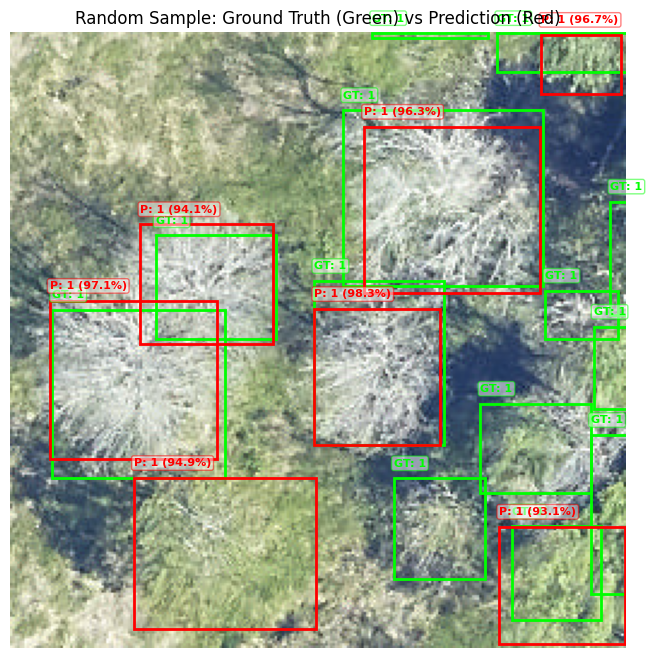

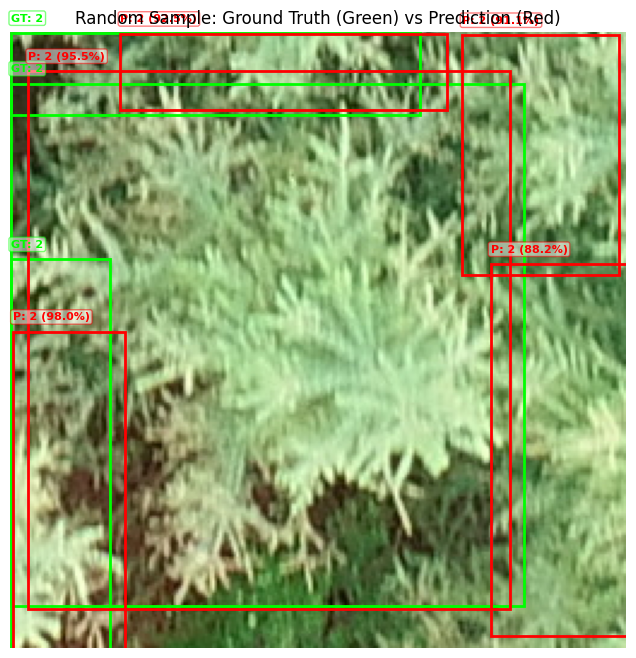

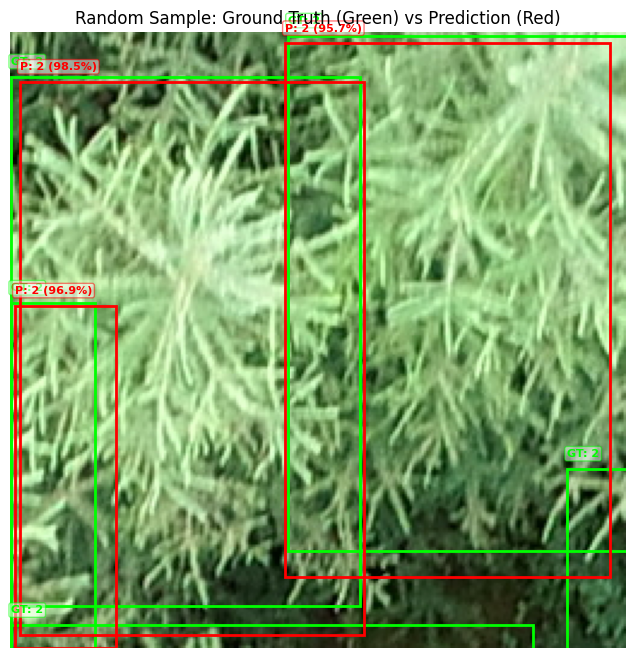

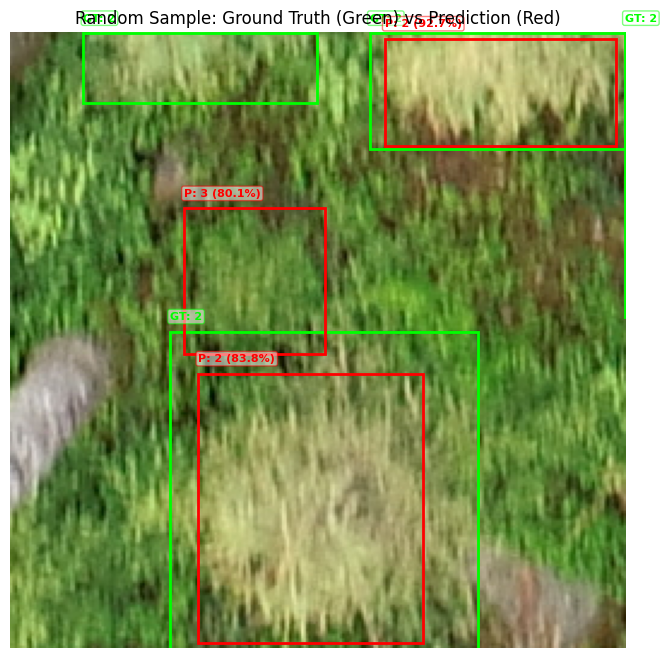

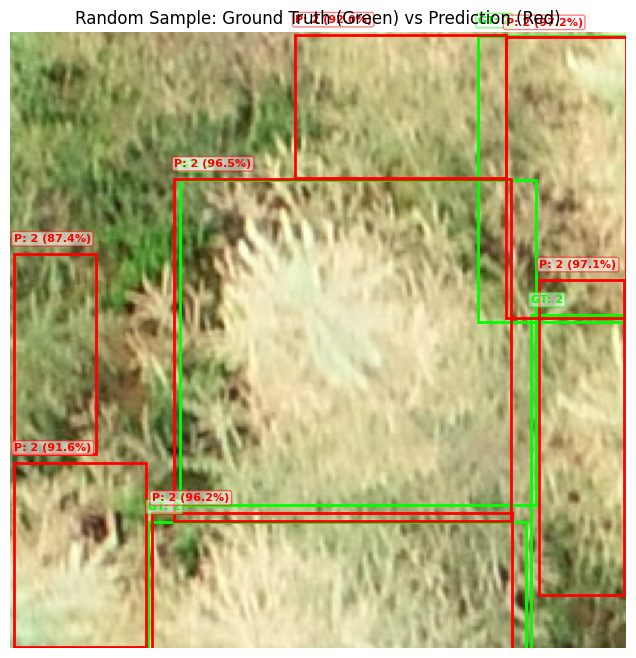

In [24]:
visualize_detections(
    model=model,
    dataset=val_dataset,
    num_images=5,
    device=dev,
    score_thresh=0.8    
)

<div style="background-color:#fefcbf; border-left: 6px solid #d69e2e; padding: 1em; font-family: 'Segoe UI', sans-serif;">

<h1 style="color:darkgreen">📊 Model Evaluation: Performance Metrics on Test Dataset</h1>

<p>This evaluation function computes a wide range of metrics—both object detection-specific and image similarity-based—to comprehensively assess model performance after training.</p>

---

<h3 style="color:teal">🧪 Function: <code>evaluate_model()</code></h3>

<ul>
  <li><strong>Inputs:</strong>
    <ul>
      <li><code>model</code>: Trained object detection model (e.g., Faster R-CNN)</li>
      <li><code>dataset</code>: Test dataset (returns image and ground-truth annotations)</li>
      <li><code>device</code>: 'cpu' or 'cuda'</li>
    </ul>
  </li>
</ul>

---

<h3 style="color:orange">📐 Core Metric Components</h3>

<ul>
  <li><strong>Bounding Box Matching:</strong>
    <ul>
      <li>IoU computed between predicted and ground-truth boxes</li>
      <li>Matched if <code>IoU &gt; 0.5</code></li>
    </ul>
  </li>

  <li><strong>Classification Metrics:</strong>
    <ul>
      <li>Precision, Recall, Accuracy</li>
      <li>Confusion Matrix for true vs predicted labels</li>
    </ul>
  </li>

  <li><strong>Localization & Mask Similarity:</strong>
    <ul>
      <li><code>SSIM</code> (Structural Similarity Index)</li>
      <li><code>PSNR</code> (Peak Signal-to-Noise Ratio)</li>
      <li><code>MSE</code> (Mean Squared Error)</li>
      <li>Binary masks created from predicted and true boxes for comparison</li>
    </ul>
  </li>
</ul>

---

<h3 style="color:royalblue">📈 Outputs and Interpretation</h3>

<ul>
  <li><code>IoU</code>: Measures overlap quality between predicted and true boxes</li>
  <li><code>mAP (approx.)</code>: Averaged IoU – a proxy for mean Average Precision</li>
  <li><code>SSIM, PSNR, MSE</code>: Evaluate similarity of shape/coverage</li>
  <li><code>Confusion Matrix</code>: Visual breakdown of prediction errors per class</li>
</ul>

---


<blockquote style="border-left: 4px solid #ccc; padding-left: 1em;">
⚙️ <em>Note:</em> Thresholds and metric selection were tuned to match the nature of tree crown annotations—precision mattered as much as recall due to class imbalance and fine structural differences.
</blockquote>


In [15]:
import torch
from torchvision.ops import box_iou
from sklearn.metrics import precision_score, recall_score, accuracy_score, confusion_matrix
from PIL import Image, ImageDraw
import numpy as np
import cv2
from skimage.metrics import structural_similarity as ssim, peak_signal_noise_ratio as psnr
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns


def evaluate_model(model, dataset, device):
    model.eval()

    matched_true_labels = []
    matched_pred_labels = []

    iou_scores = []
    ssim_scores = []
    psnr_scores = []
    mse_scores = []

    for img, target in tqdm(dataset, desc="Evaluating"):
        img_tensor = img.to(device)
        with torch.no_grad():
            pred = model([img_tensor])[0]

        pred_boxes = pred['boxes'].cpu()
        pred_labels = pred['labels'].cpu()
        pred_scores = pred['scores'].cpu()

        true_boxes = target['boxes']
        true_labels = target['labels']

        keep = pred_scores > 0.6
        pred_boxes = pred_boxes[keep]
        pred_labels = pred_labels[keep]

        # Box matching using IoU
        if len(true_boxes) > 0 and len(pred_boxes) > 0:
            ious = box_iou(pred_boxes, true_boxes)
            for i in range(len(pred_boxes)):
                max_iou, max_j = ious[i].max(0)
                if max_iou > 0.5:
                    matched_pred_labels.append(pred_labels[i].item())
                    matched_true_labels.append(true_labels[max_j].item())
                    iou_scores.append(max_iou.item())
        else:
            # No matches, handle unmatched
            matched_true_labels.extend(true_labels.tolist())
            matched_pred_labels.extend([-1] * len(true_labels))

        # Draw masks for SSIM/PSNR
        h, w = img_tensor.shape[1:]
        gt_img = Image.new("L", (w, h), 0)
        pr_img = Image.new("L", (w, h), 0)

        draw_gt = ImageDraw.Draw(gt_img)
        draw_pr = ImageDraw.Draw(pr_img)

        for box in true_boxes:
            draw_gt.rectangle(box.tolist(), fill=255)

        for box in pred_boxes:
            draw_pr.rectangle(box.tolist(), fill=255)

        gt_arr = np.array(gt_img)
        pr_arr = np.array(pr_img)

        ssim_scores.append(ssim(gt_arr, pr_arr, data_range=255))
        psnr_scores.append(psnr(gt_arr, pr_arr, data_range=255))
        mse_scores.append(np.mean((gt_arr - pr_arr) ** 2))

    # Remove -1 predictions for precision/recall (optional)
    clean_true = [t for t, p in zip(matched_true_labels, matched_pred_labels) if p != -1]
    clean_pred = [p for p in matched_pred_labels if p != -1]

    # Compute metrics
    precision = precision_score(clean_true, clean_pred, average='macro', zero_division=0)
    recall = recall_score(clean_true, clean_pred, average='macro', zero_division=0)
    accuracy = accuracy_score(clean_true, clean_pred)
    conf_matrix = confusion_matrix(clean_true, clean_pred)

    print("\n--- Evaluation Metrics ---")
    print(f"IoU (avg): {np.mean(iou_scores):.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"Accuracy: {accuracy:.4f}")
    print(f"mAP (approx.): {np.mean(iou_scores):.4f}")  # rough mAP
    print(f"SSIM (avg): {np.mean(ssim_scores):.4f}")
    print(f"PSNR (avg): {np.mean(psnr_scores):.4f}")
    print(f"MSE (avg): {np.mean(mse_scores):.4f}")
    print("\nConfusion Matrix:")
    print(conf_matrix)

    # Visualize confusion matrix with labels
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues",
                xticklabels=np.unique(clean_true),
                yticklabels=np.unique(clean_true))
    plt.title("Confusion Matrix")
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.tight_layout()
    plt.show()



Evaluating: 100%|██████████| 5000/5000 [07:26<00:00, 11.19it/s]



--- Evaluation Metrics ---
IoU (avg): 0.7452
Precision: 0.9726
Recall: 0.9838
Accuracy: 0.9839
mAP (approx.): 0.7452
SSIM (avg): 0.7548
PSNR (avg): 8.2308
MSE (avg): 0.1899

Confusion Matrix:
[[ 4413     0     0]
 [    0 10643   212]
 [    0    78  2618]]


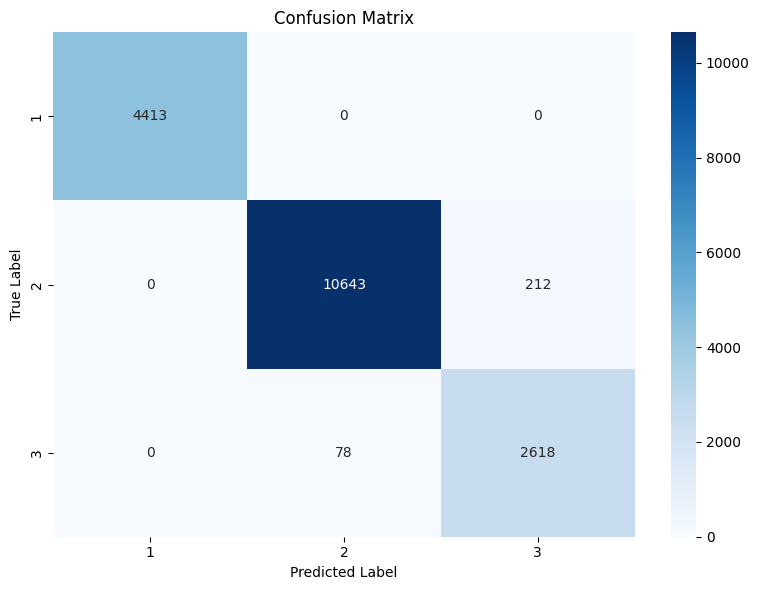

In [16]:
evaluate_model(model, train_dataset, dev)


<div style="background-color:rgba(255,248,240,0.6); border-left:6px solid #dd6b20; padding:1.5em; font-family:'Segoe UI', sans-serif; border-radius:8px;">

  <h1 style="color:#dd6b20; font-size:1.6em;">🧩 Simple Visualization of Box Predictions with Stitching</h1>

  <p style="font-size:1.05em; color:#4a4a4a;">
    Slide a window over the full image, run your detector on each tile, then stitch and plot all detections alongside ground-truth boxes.
  </p>

  <p><strong style="color:#dd6b20;">• Parameters:</strong><br>
    – <code style="color:#d2691e;">P</code> (patch size, default 256)<br>
    – <code style="color:#d2691e;">O</code> (overlap, default 64)<br>
    – <code style="color:#d2691e;">score_thresh</code> (filter threshold, default 0.5)
  </p>

  <p><strong style="color:#dd6b20;">• Steps:</strong></p>
  <ol style="color:#3e3e3e; font-size:1.02em; line-height:1.7; margin-left:1.2em;">
    <li>Load full image and compute tile offsets with stride <code style="color:#d2691e;">P–O</code>.</li>
    <li>For each tile: crop, tensorize, run <code style="color:#d2691e;">model(tensor)</code>, filter by score.</li>
    <li>Shift tile coordinates back to full-image frame and collect all detections.</li>
    <li>Parse ground-truth from XML (if available) into <code style="color:#d2691e;">gt_boxes</code>.</li>
    <li>Plot full image:  
      <span style="color:lime;">green</span> for GT, <span style="color:red;">red</span> for predictions, with labels & scores.
    </li>
  </ol>

  <p style="color:slategray; font-style:italic; font-size:1.02em; margin-top:1em;">
    🎯 This function lets you verify model performance on full-resolution images without manual cropping—essential for end-to-end qualitative checks.
  </p>

</div>


In [41]:
import os
import torch
from PIL import Image
from torchvision.transforms import ToTensor
import xml.etree.ElementTree as ET
import matplotlib.pyplot as plt
import matplotlib.patches as patches

def visualize_full_image_basic(img_path, annotation_dir, model,
                               P=256, O=64, score_thresh=0.5):
    # device
    dev = next(model.parameters()).device

    # load full image
    img = Image.open(img_path).convert("RGB")
    W, H = img.size
    stride = P - O

    # compute tile offsets
    x_offsets = list(range(0, W - P + 1, stride))
    if (W - P) % stride:
        x_offsets.append(W - P)
    y_offsets = list(range(0, H - P + 1, stride))
    if (H - P) % stride:
        y_offsets.append(H - P)

    # collect all detections
    all_boxes, all_scores, all_labels = [], [], []

    for x0 in x_offsets:
        for y0 in y_offsets:
            patch = img.crop((x0, y0, x0 + P, y0 + P))
            tensor = ToTensor()(patch).to(dev).unsqueeze(0)
            with torch.no_grad():
                out = model(tensor)[0]

            # filter by score threshold
            keep = out["scores"] > score_thresh
            boxes = out["boxes"][keep].cpu()
            scores = out["scores"][keep].cpu()
            labels = out["labels"][keep].cpu()

            # shift tile coords to full image coords
            if boxes.numel() > 0:
                boxes[:, [0, 2]] += x0
                boxes[:, [1, 3]] += y0

                all_boxes.append(boxes)
                all_scores.append(scores)
                all_labels.append(labels)

    if not all_boxes:
        print(f"No detections in {os.path.basename(img_path)} above score {score_thresh}")
        return

    # concatenate everything
    all_boxes  = torch.cat(all_boxes)
    all_scores = torch.cat(all_scores)
    all_labels = torch.cat(all_labels)

    # load ground-truth boxes (if any)
    base = os.path.splitext(os.path.basename(img_path))[0]
    gt_boxes = []
    xml_path = os.path.join(annotation_dir, base + ".xml")
    if os.path.exists(xml_path):
        tree = ET.parse(xml_path)
        for obj in tree.getroot().findall("object"):
            b = obj.find("bndbox")
            xmin = float(b.find("xmin").text)
            ymin = float(b.find("ymin").text)
            xmax = float(b.find("xmax").text)
            ymax = float(b.find("ymax").text)
            gt_boxes.append([xmin, ymin, xmax, ymax])

    # plotting
    fig, ax = plt.subplots(figsize=(10,10))
    ax.imshow(img)

    # plot GT in green
    for xmin, ymin, xmax, ymax in gt_boxes:
        ax.add_patch(
            patches.Rectangle(
                (xmin, ymin), xmax - xmin, ymax - ymin,
                edgecolor="lime", facecolor="none", linewidth=2
            )
        )

    # plot detections in red
    for (xmin, ymin, xmax, ymax), lbl, scr in zip(all_boxes, all_labels, all_scores):
        ax.add_patch(
            patches.Rectangle(
                (xmin, ymin), xmax - xmin, ymax - ymin,
                edgecolor="red", facecolor="none", linewidth=1
            )
        )
        ax.text(
            xmin, ymin - 4, f"{lbl.item()} {scr:.2f}",
            fontsize=7, color="white",
            bbox=dict(facecolor="red", pad=1)
        )

    ax.set_title(os.path.basename(img_path))
    ax.axis("off")
    plt.tight_layout()
    plt.show()


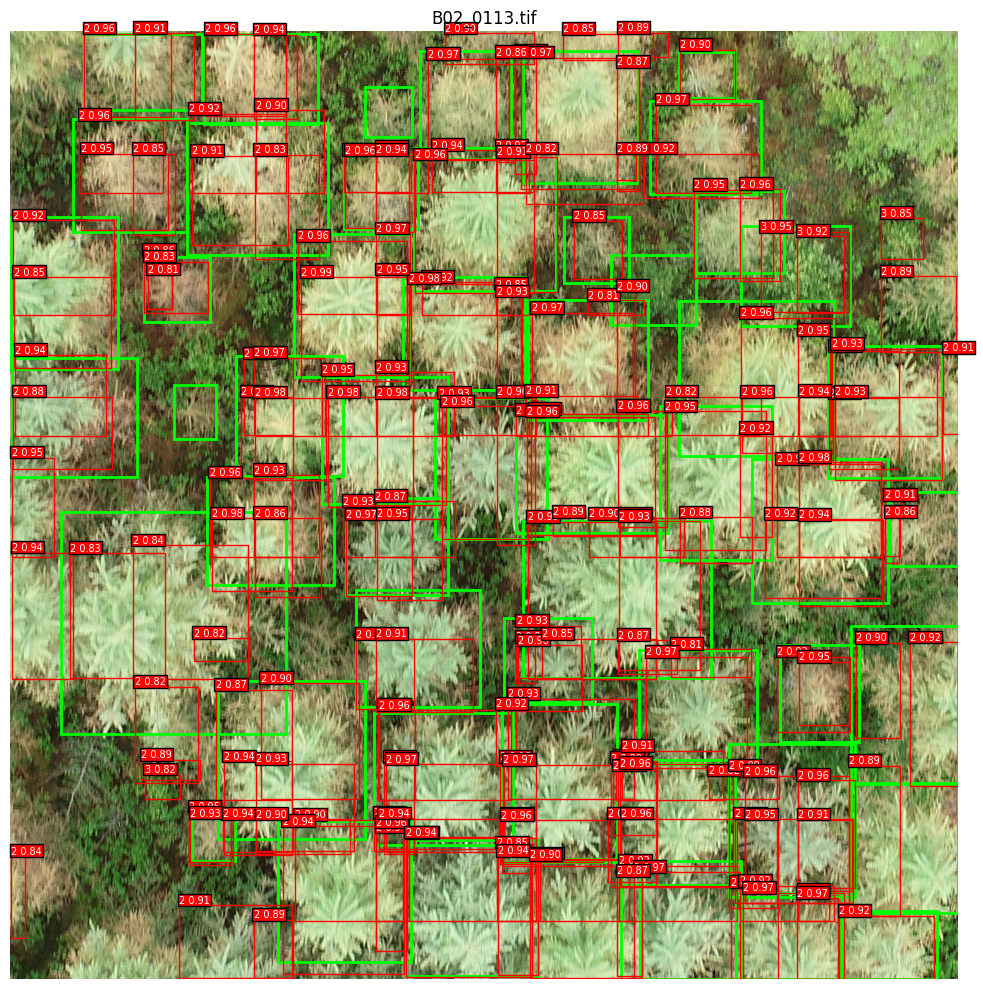

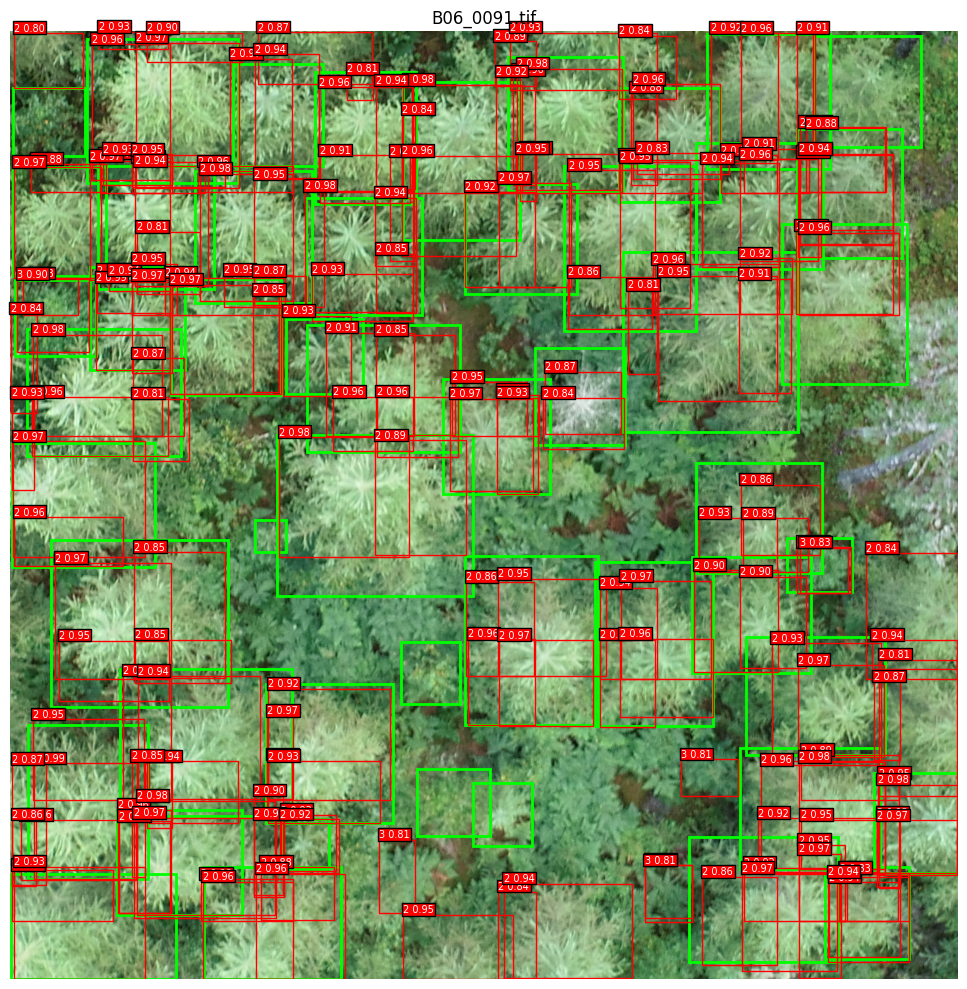

In [42]:
full_image_dir = "/kaggle/input/tree-crown-dataset/neon-dataset/training/RGB"
annotation_dir  = "/kaggle/input/tree-crown-dataset/neon-dataset/annotations"

for img_name in os.listdir(full_image_dir)[41:43]:
    visualize_full_image_basic(
        os.path.join(full_image_dir, img_name),
        annotation_dir, model,
        score_thresh=0.8
    )


<h2 style="color:darkgreen">🌲 Full-Image Inference with Sliding Window & Post-Processing (Better Version 1)</h2>

<p>This module implements full-image detection using a patch-wise sliding window approach. It combines predictions from overlapping tiles using <strong>Soft-NMS</strong> and <strong>Hard-NMS pruning</strong> to reduce duplicates and refine final predictions.</p>

---

<h3 style="color:teal">🧪 Function: <code>visualize_full_image_pruned()</code></h3>

<ul>
  <li><strong>Inputs:</strong>
    <ul>
      <li><code>img_path</code>: Path to a full-size RGB image</li>
      <li><code>annotation_dir</code>: Folder with XML annotations (Pascal VOC format)</li>
      <li><code>model</code>: Trained object detection model</li>
      <li><code>P</code>: Patch size (e.g., 256)</li>
      <li><code>O</code>: Overlap between adjacent patches (e.g., 96)</li>
      <li><code>score_thresh</code>: Minimum confidence for filtering predictions</li>
      <li><code>soft_iou</code>: IoU threshold for Soft-NMS</li>
      <li><code>prune_iou</code>: IoU threshold for Hard-NMS (to remove duplicates)</li>
    </ul>
  </li>
</ul>

---

<h3 style="color:orange">🧩 Sliding Window Inference + Stitching</h3>

<ul>
  <li>Full image is divided into overlapping patches using a sliding window strategy</li>
  <li>Each patch is passed through the model independently</li>
  <li>Predicted boxes are translated back to the original image coordinate frame</li>
</ul>

---

<h3 style="color:crimson">🧠 Post-Processing Techniques</h3>

<ul>
  <li><strong>Soft-NMS</strong> (per class): Smoothly decays the score of overlapping boxes to preserve nearby instances</li>
  <li><strong>Hard-NMS</strong>: Final pruning of highly overlapping boxes using <code>torchvision.ops.batched_nms()</code></li>
  <li>Sorting: Remaining predictions sorted by confidence score (descending)</li>
</ul>

---

<h3 style="color:royalblue">🔍 Visualization Output</h3>

<ul>
  <li><span style="color:lime">Green Boxes:</span> Ground truth annotations loaded from corresponding XML files</li>
  <li><span style="color:red">Red Boxes:</span> Final model predictions after Soft-NMS and Hard-NMS pruning</li>
  <li>Each predicted box is labeled with class ID and confidence score</li>
</ul>

---

<h3 style="color:gray">🧠 Why This Was Important in Our Project</h3>

<ul>
  <li>Allowed inference on high-resolution images exceeding model input size</li>
  <li>Sliding window ensured complete coverage of large tree crowns</li>
  <li>Soft-NMS + Hard-NMS reduced duplicate detections from overlapping tiles</li>
  <li>Visual comparison with ground truth confirmed alignment and box quality</li>
</ul>

<blockquote style="border-left: 4px solid #ccc; padding-left: 1em;">
🔧 <em>Note:</em> This method provided scalable, interpretable predictions and aligned well with real-world use-cases like aerial forest mapping where trees span multiple image tiles.
</blockquote>


In [35]:
import os
from PIL import Image
import torch
from torchvision.transforms import ToTensor
from torchvision.ops import batched_nms
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import xml.etree.ElementTree as ET
from sklearn.metrics import precision_score, recall_score
from torchvision.ops import box_iou, batched_nms
from torchvision.transforms import ToTensor

# --- Soft-NMS implementation (unchanged) ---
def soft_nms(boxes, scores, iou_thresh=0.3, sigma=0.5, score_thresh=0.001):
    boxes_np  = boxes.cpu().numpy()
    scores_np = scores.cpu().numpy()
    idxs = list(range(len(scores_np)))
    keep = []
    while idxs:
        current = max(idxs, key=lambda i: scores_np[i])
        if scores_np[current] < score_thresh:
            break
        keep.append(current)
        idxs.remove(current)
        x1, y1, x2, y2 = boxes_np[current]
        area_curr = (x2 - x1) * (y2 - y1)
        for j in idxs[:]:
            xx1 = max(x1, boxes_np[j,0])
            yy1 = max(y1, boxes_np[j,1])
            xx2 = min(x2, boxes_np[j,2])
            yy2 = min(y2, boxes_np[j,3])
            w = max(0, xx2-xx1); h = max(0, yy2-yy1)
            inter = w*h
            area_j = (boxes_np[j,2]-boxes_np[j,0])*(boxes_np[j,3]-boxes_np[j,1])
            iou = inter / (area_curr + area_j - inter)
            scores_np[j] *= np.exp(-(iou*iou)/sigma)
            if scores_np[j] < score_thresh:
                idxs.remove(j)
    return keep

# --- Prune overlaps by hard NMS (keeps only highest-scoring box per overlap cluster) ---
def prune_overlaps_keep_all(boxes, scores, labels, iou_thresh=0.3):
    keep = batched_nms(boxes, scores, labels, iou_threshold=iou_thresh)
    return boxes[keep], scores[keep], labels[keep]



# … (soft_nms and prune_overlaps_keep_all as before) …

def visualize_full_image_pruned(img_path, annotation_dir, model,
                                P=256, O=96,
                                score_thresh=0.6,
                                soft_iou=0.3,
                                prune_iou=0.1):
    dev = next(model.parameters()).device
    model.eval()
    to_tensor = ToTensor()

    img = Image.open(img_path).convert("RGB")
    W, H = img.size
    S = P - O

    # collect per‐tile detections
    all_boxes, all_scores, all_labels = [], [], []
    x_off = list(range(0, W-P+1, S)) + ([W-P] if (W-P)%S else [])
    y_off = list(range(0, H-P+1, S)) + ([H-P] if (H-P)%S else [])
    for x0 in x_off:
        for y0 in y_off:
            patch = img.crop((x0, y0, x0+P, y0+P))
            t = to_tensor(patch).to(dev).unsqueeze(0)
            with torch.no_grad():
                out = model(t)[0]
            mask = out["scores"] > score_thresh
            b = out["boxes"][mask].cpu()
            s = out["scores"][mask].cpu()
            l = out["labels"][mask].cpu()
            if not b.numel(): 
                continue
            b[:,[0,2]] += x0
            b[:,[1,3]] += y0
            all_boxes.append(b); all_scores.append(s); all_labels.append(l)

    if not all_boxes:
        print(f"No detections in {os.path.basename(img_path)}")
        return

    all_boxes  = torch.cat(all_boxes)
    all_scores = torch.cat(all_scores)
    all_labels = torch.cat(all_labels)

    # Soft‐NMS per class
    boxes_sn, scores_sn, labels_sn = [], [], []
    for cls in all_labels.unique().tolist():
        idxs = (all_labels==cls).nonzero(as_tuple=True)[0]
        b_cls, s_cls = all_boxes[idxs], all_scores[idxs]
        keep = soft_nms(b_cls, s_cls, iou_thresh=soft_iou)
        if keep:
            boxes_sn.append(b_cls[keep])
            scores_sn.append(s_cls[keep])
            labels_sn.extend([cls]*len(keep))

    if not boxes_sn:
        print("No boxes after Soft-NMS")
        return

    boxes_sn  = torch.cat(boxes_sn)
    scores_sn = torch.cat(scores_sn)
    labels_sn = torch.tensor(labels_sn)

    # Hard‐NMS prune
    boxes_pr, scores_pr, labels_pr = prune_overlaps_keep_all(
        boxes_sn, scores_sn, labels_sn, iou_thresh=prune_iou
    )

    # sort by score desc
    order = scores_pr.argsort(descending=True)
    boxes_pr, scores_pr, labels_pr = boxes_pr[order], scores_pr[order], labels_pr[order]

    # Load GT (boxes + labels)
    base = os.path.splitext(os.path.basename(img_path))[0]
    gt_data = []
    xml = os.path.join(annotation_dir, base + ".xml")
    if os.path.exists(xml):
        tree = ET.parse(xml)
        for obj in tree.getroot().findall("object"):
            # get class
            tree_node = obj.find("tree")
            if tree_node is not None and tree_node.text and tree_node.text.strip():
                cls_name = tree_node.text.strip().title()
            else:
                name_node = obj.find("name")
                cls_name = name_node.text.strip().title() if (name_node is not None and name_node.text and name_node.text.strip()) else "Other"
            # get box
            bnd = obj.find("bndbox")
            xmin,ymin,xmax,ymax = map(float,(
                bnd.find("xmin").text, bnd.find("ymin").text,
                bnd.find("xmax").text, bnd.find("ymax").text
            ))
            if xmax>xmin and ymax>ymin:
                gt_data.append((xmin, ymin, xmax, ymax, cls_name))

    # Plot
    fig, ax = plt.subplots(figsize=(10,10))
    ax.imshow(img)

    # GT in green with labels
    for x0,y0,x1,y1,cls_name in gt_data:
        ax.add_patch(patches.Rectangle((x0,y0), x1-x0, y1-y0,
                                       edgecolor="lime", facecolor="none", lw=2))
        ax.text(x0, y0-5, cls_name,
                color="white", fontsize=8,
                bbox=dict(facecolor="lime", pad=1))

    # Predictions in red
    for (x0,y0,x1,y1), lbl, sc in zip(boxes_pr, labels_pr, scores_pr):
        ax.add_patch(patches.Rectangle((x0,y0), x1-x0, y1-y0,
                                       edgecolor="red", facecolor="none", lw=2))
        ax.text(x0, y0-5, f"{lbl.item()} {sc:.2f}",
                color="white", fontsize=8,
                bbox=dict(facecolor="red", pad=1))

    ax.set_title(os.path.basename(img_path))
    ax.axis("off")
    plt.show()


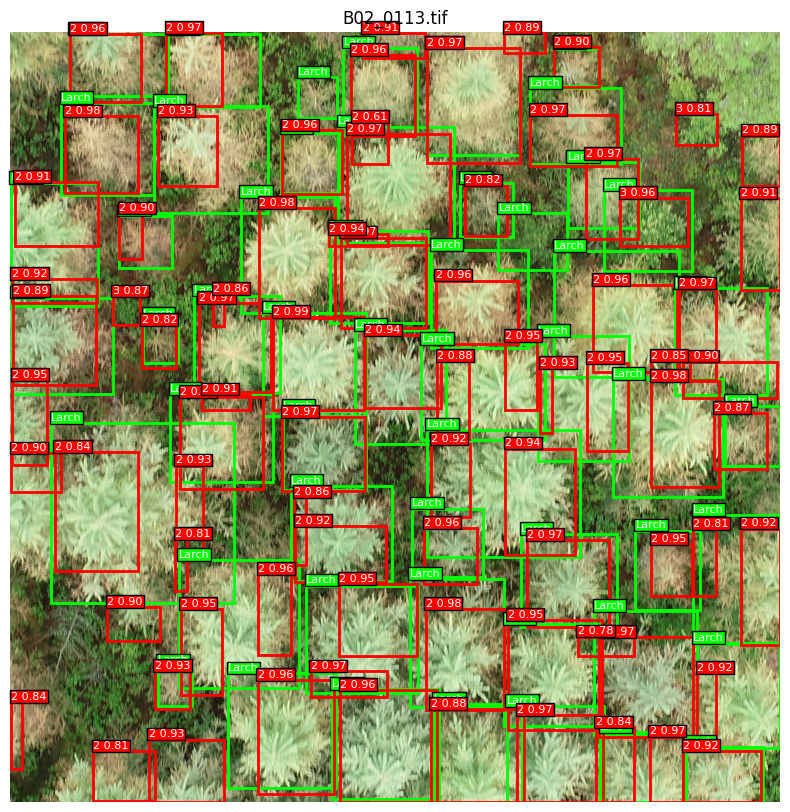

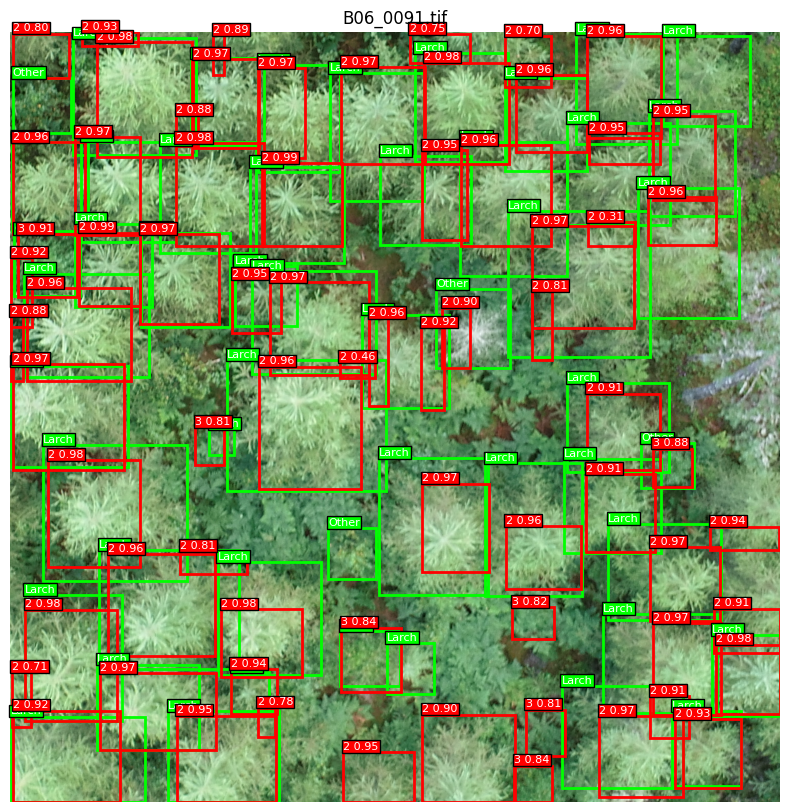

In [36]:
full_image_dir = "/kaggle/input/tree-crown-dataset/neon-dataset/training/RGB"
annotation_dir = "/kaggle/input/tree-crown-dataset/neon-dataset/annotations"

for img_name in os.listdir(full_image_dir)[41:43]:
    visualize_full_image_pruned(
        os.path.join(full_image_dir, img_name),
        annotation_dir,
        model,
        P=256, O=96,
        score_thresh=0.8,
        soft_iou=0.3,
        prune_iou=0.1
    )


<div style="background-color:rgba(248,240,255,0.6); border-left:6px solid #805ad5; padding:1.5em; font-family:'Segoe UI', sans-serif; border-radius:8px;">

  <h2 style="color:#805ad5; font-size:1.6em;">✨ Visualization Better Version 2</h2>

  <p style="font-size:1.05em; color:#3e3d3f;">
    Enhanced full-image stitching with overlap‐merging, Soft-NMS, and final prune to keep all meaningful detections:
  </p>

  <p><strong style="color:#805ad5;">• Core Utilities:</strong><br>
    – <code style="color:#6b46c1;">merge_overlapping_boxes()</code>: unions same-class boxes with IoU &gt; threshold<br>
    – <code style="color:#6b46c1;">soft_nms()</code>: scores suppression with Gaussian/linear decay<br>
    – <code style="color:#6b46c1;">prune_overlaps_keep_all()</code>: final hard-NMS to remove near-duplicates
  </p>

  <p><strong style="color:#805ad5;">• Processing Steps:</strong></p>
  <ol style="color:#4a4a4a; font-size:1.02em; line-height:1.7; margin-left:1.2em;">
    <li>Slide window (size <code>P</code>, overlap <code>O</code>) over full image, run model on each tile.</li>
    <li>Collect and shift tile detections into full-image coordinates.</li>
    <li>Apply <code>soft_nms</code> per class to softly suppress overlapping boxes.</li>
    <li>Merge any same-class boxes with IoU &gt; <code>soft_iou</code> via <code>merge_overlapping_boxes</code>.</li>
    <li>Perform final prune with <code>prune_overlaps_keep_all</code> using <code>prune_iou</code>.</li>
    <li>Sort by score, then plot:<br>
      – <span style="color:lime;">green</span> for ground truth,<br>
      – <span style="color:red;">red</span> for predictions with labels & scores.
    </li>
  </ol>

  <p style="color:#696969; font-style:italic; font-size:1.02em; margin-top:1em;">
    🔍 This version reduces duplicate overlaps, maintains high-confidence detections, and provides a clean stitched visualization of both predictions and ground truth.
  </p>

</div>


In [43]:
def merge_overlapping_boxes(boxes, scores, labels, iou_thresh=0.3):
    """
    For any two boxes of the same class whose IoU > iou_thresh,
    replace them with their bounding‐union and carry forward the max score.
    """
    keep_boxes, keep_scores, keep_labels = [], [], []
    used = set()
    iou_mat = box_iou(boxes, boxes)  # [N,N]

    for i in range(len(boxes)):
        if i in used:
            continue
        # find everything overlapping this one
        overlaps = (iou_mat[i] > iou_thresh).nonzero(as_tuple=True)[0].tolist()
        # only same‐class overlaps
        same_cls = [j for j in overlaps if labels[j] == labels[i]]
        # mark them used
        for j in same_cls:
            used.add(j)
        # merge coords
        group = boxes[same_cls]
        x_min = group[:,0].min().item()
        y_min = group[:,1].min().item()
        x_max = group[:,2].max().item()
        y_max = group[:,3].max().item()
        keep_boxes.append([x_min, y_min, x_max, y_max])
        # carry forward highest score
        keep_scores.append(scores[same_cls].max().item())
        keep_labels.append(labels[i].item())

    return (
        torch.tensor(keep_boxes, dtype=torch.float32),
        torch.tensor(keep_scores, dtype=torch.float32),
        torch.tensor(keep_labels, dtype=torch.int64),
    )


In [38]:
import os
from PIL import Image
import torch
from torchvision.transforms import ToTensor
from torchvision.ops import batched_nms
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import xml.etree.ElementTree as ET

# … (soft_nms and prune_overlaps_keep_all as before) …

def visualize_full_image_pruned(img_path, annotation_dir, model,
                                P=256, O=96,
                                score_thresh=0.6,
                                soft_iou=0.3,
                                prune_iou=0.1):
    dev = next(model.parameters()).device
    model.eval()
    to_tensor = ToTensor()

    img = Image.open(img_path).convert("RGB")
    W, H = img.size
    S = P - O

    # collect per‐tile detections
    all_boxes, all_scores, all_labels = [], [], []
    x_off = list(range(0, W-P+1, S)) + ([W-P] if (W-P)%S else [])
    y_off = list(range(0, H-P+1, S)) + ([H-P] if (H-P)%S else [])
    for x0 in x_off:
        for y0 in y_off:
            patch = img.crop((x0, y0, x0+P, y0+P))
            t = to_tensor(patch).to(dev).unsqueeze(0)
            with torch.no_grad():
                out = model(t)[0]
            mask = out["scores"] > score_thresh
            b = out["boxes"][mask].cpu()
            s = out["scores"][mask].cpu()
            l = out["labels"][mask].cpu()
            if not b.numel(): 
                continue
            b[:,[0,2]] += x0
            b[:,[1,3]] += y0
            all_boxes.append(b); all_scores.append(s); all_labels.append(l)

    if not all_boxes:
        print(f"No detections in {os.path.basename(img_path)}")
        return

    all_boxes  = torch.cat(all_boxes)
    all_scores = torch.cat(all_scores)
    all_labels = torch.cat(all_labels)

    # Soft‐NMS per class
    boxes_sn, scores_sn, labels_sn = [], [], []
    for cls in all_labels.unique().tolist():
        idxs = (all_labels==cls).nonzero(as_tuple=True)[0]
        b_cls, s_cls = all_boxes[idxs], all_scores[idxs]
        keep = soft_nms(b_cls, s_cls, iou_thresh=soft_iou)
        if keep:
            boxes_sn.append(b_cls[keep])
            scores_sn.append(s_cls[keep])
            labels_sn.extend([cls]*len(keep))

    if not boxes_sn:
        print("No boxes after Soft-NMS")
        return

    boxes_sn  = torch.cat(boxes_sn)
    scores_sn = torch.cat(scores_sn)
    labels_sn = torch.tensor(labels_sn)

    # … after soft‐NMS per class, before prune_overlaps_keep_all …

    boxes_sn, scores_sn, labels_sn = merge_overlapping_boxes(
        boxes_sn, scores_sn, labels_sn, iou_thresh=0.3
    )
    
    # now do your final hard‐NMS prune to knock out any remaining near‐duplicates
    boxes_pr, scores_pr, labels_pr = prune_overlaps_keep_all(
        boxes_sn, scores_sn, labels_sn, iou_thresh=prune_iou
    )

    # sort by score desc
    order = scores_pr.argsort(descending=True)
    boxes_pr, scores_pr, labels_pr = boxes_pr[order], scores_pr[order], labels_pr[order]

    # Load GT (boxes + labels)
    base = os.path.splitext(os.path.basename(img_path))[0]
    gt_data = []
    xml = os.path.join(annotation_dir, base + ".xml")
    if os.path.exists(xml):
        tree = ET.parse(xml)
        for obj in tree.getroot().findall("object"):
            # get class
            tree_node = obj.find("tree")
            if tree_node is not None and tree_node.text and tree_node.text.strip():
                cls_name = tree_node.text.strip().title()
            else:
                name_node = obj.find("name")
                cls_name = name_node.text.strip().title() if (name_node is not None and name_node.text and name_node.text.strip()) else "Other"
            # get box
            bnd = obj.find("bndbox")
            xmin,ymin,xmax,ymax = map(float,(
                bnd.find("xmin").text, bnd.find("ymin").text,
                bnd.find("xmax").text, bnd.find("ymax").text
            ))
            if xmax>xmin and ymax>ymin:
                gt_data.append((xmin, ymin, xmax, ymax, cls_name))

    # Plot
    fig, ax = plt.subplots(figsize=(10,10))
    ax.imshow(img)

    # GT in green with labels
    for x0,y0,x1,y1,cls_name in gt_data:
        ax.add_patch(patches.Rectangle((x0,y0), x1-x0, y1-y0,
                                       edgecolor="lime", facecolor="none", lw=2))
        ax.text(x0, y0-5, cls_name,
                color="white", fontsize=8,
                bbox=dict(facecolor="lime", pad=1))

    # Predictions in red
    for (x0,y0,x1,y1), lbl, sc in zip(boxes_pr, labels_pr, scores_pr):
        ax.add_patch(patches.Rectangle((x0,y0), x1-x0, y1-y0,
                                       edgecolor="red", facecolor="none", lw=2))
        ax.text(x0, y0-5, f"{lbl.item()} {sc:.2f}",
                color="white", fontsize=8,
                bbox=dict(facecolor="red", pad=1))

    ax.set_title(os.path.basename(img_path))
    ax.axis("off")
    plt.show()


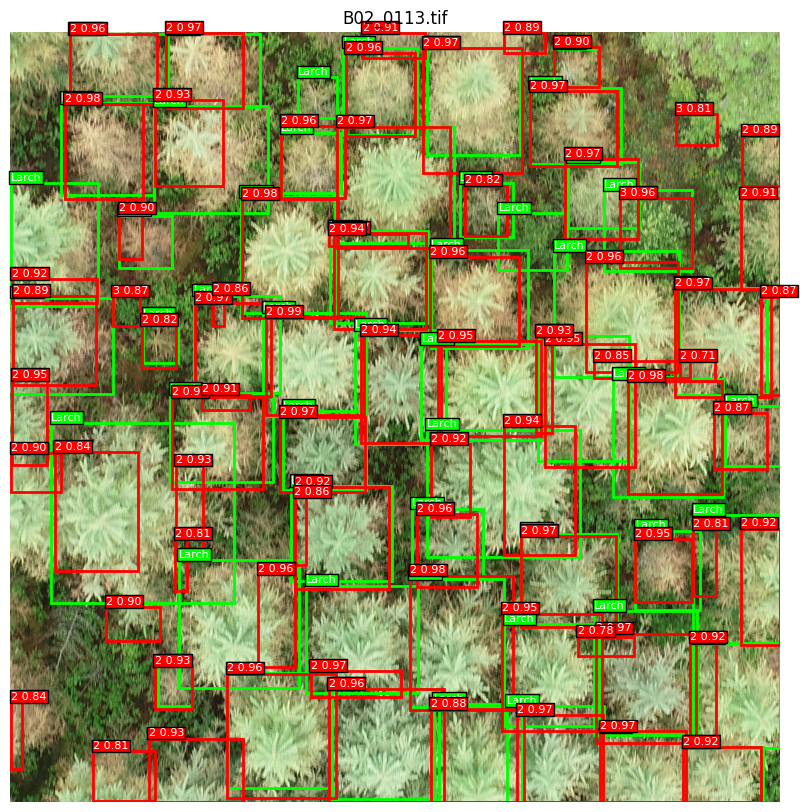

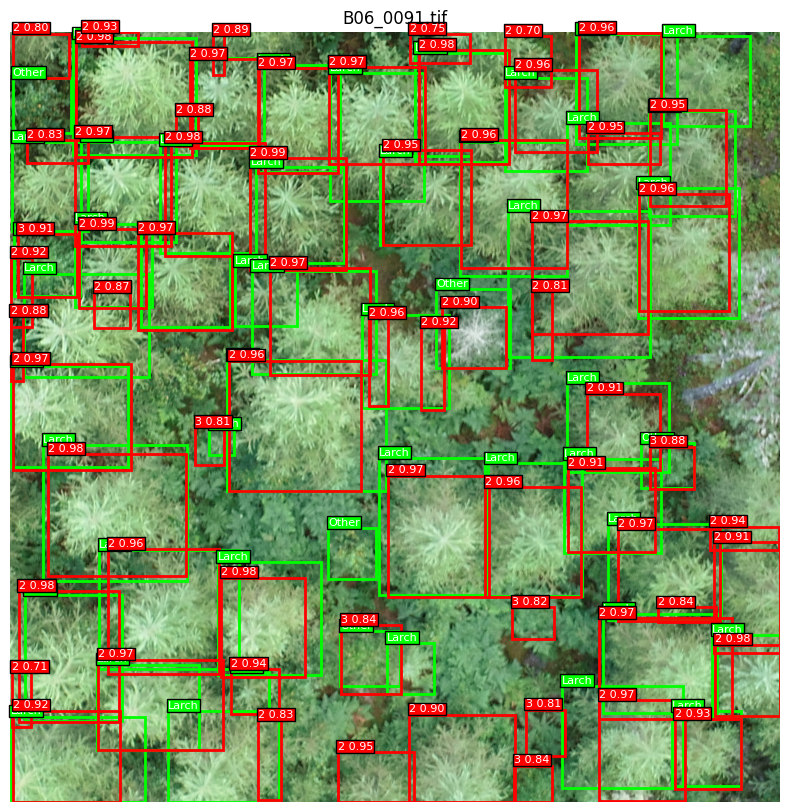

In [39]:
full_image_dir = "/kaggle/input/tree-crown-dataset/neon-dataset/training/RGB"
annotation_dir = "/kaggle/input/tree-crown-dataset/neon-dataset/annotations"

for img_name in os.listdir(full_image_dir)[41:43]:
    visualize_full_image_pruned(
        os.path.join(full_image_dir, img_name),
        annotation_dir,
        model,
        P=256, O=96,
        score_thresh=0.8,
        soft_iou=0.3,
        prune_iou=0.1
    )


<div style="background-color:rgba(240,248,255,0.5); border-left:6px solid #3182ce; padding:1.5em; font-family:'Segoe UI', sans-serif; border-radius:8px;">

  <h1 style="color:#3182ce; font-size:1.6em;">📊 Evaluation for Full Images</h1>

  <p style="font-size:1.05em; color:#2f4f4f;">
    Run inference on full-resolution tiles, apply advanced NMS & pruning, then compute detection & mask metrics:
  </p>

  <p><strong style="color:#3182ce;">• Label Maps:</strong><br>
    <code style="color:#2b6cb0;">LABEL_MAP</code> &amp; <code style="color:#2b6cb0;">INV_LABELS</code> for “Tree”, “Larch”, “Other”
  </p>

  <p><strong style="color:#3182ce;">• Inference Pipeline:</strong></p>
  <ul style="line-height:1.7; font-size:1.02em; color:#3e3d3f;">
    <li>Tile full image (patch size <code>P</code>=256, overlap <code>O</code>=96).</li>
    <li>Collect model predictions &gt; <code>score_thresh</code>=0.8, shift back to global coords.</li>
    <li>Soft-NMS (<code>soft_iou</code>=0.3), merge overlaps, then hard prune (<code>prune_iou</code>=0.1).</li>
  </ul>

  <p><strong style="color:#3182ce;">• Ground-Truth Extraction:</strong><br>
    Parse XML annotations into <code style="color:#2b6cb0;">gt_b</code> &amp; <code style="color:#2b6cb0;">gt_l</code>
  </p>

  <p><strong style="color:#3182ce;">• Metric Computation:</strong></p>
  <ul style="line-height:1.7; font-size:1.02em; color:#3e3d3f;">
    <li>Match detections to GT via IoU ≥ <code>iou_match</code>=0.5 → TP, FP, FN.</li>
    <li>Compute <strong>Precision</strong>, <strong>Recall</strong>, <strong>Accuracy</strong>, approximate mAP (IoU avg).</li>
    <li>Generate pixel masks and evaluate <strong>SSIM</strong>, <strong>PSNR</strong>, and <strong>MSE</strong>.</li>
    <li>Plot confusion matrix for classes “Tree”, “Larch”, “Other” using Seaborn heatmap.</li>
  </ul>

  <p style="color:slategray; font-style:italic; font-size:1.02em; margin-top:1em;">
    🚀 This comprehensive evaluation provides both object-level detection metrics and pixel-level mask similarity scores for a holistic performance assessment.
  </p>

</div>


In [47]:
import os
import torch
import random
import numpy as np
from PIL import Image, ImageDraw
from torchvision.transforms import ToTensor
from torchvision.ops import box_iou, batched_nms
from sklearn.metrics import precision_score, recall_score, accuracy_score, confusion_matrix
from skimage.metrics import structural_similarity as ssim, peak_signal_noise_ratio as psnr
import matplotlib.pyplot as plt
import seaborn as sns
import xml.etree.ElementTree as ET
from typing import List

# — Label maps —
LABEL_MAP = {"Tree": 1, "Larch": 2, "Other": 3}
INV_LABELS = {1: "Tree", 2: "Larch", 3: "Other"}

# — Soft-NMS —
def soft_nms(boxes, scores, iou_thresh=0.3, sigma=0.5, score_thresh=0.001):
    boxes_np, scores_np = boxes.cpu().numpy(), scores.cpu().numpy()
    idxs, keep = list(range(len(scores_np))), []
    while idxs:
        i = max(idxs, key=lambda x: scores_np[x])
        if scores_np[i] < score_thresh: break
        keep.append(i); idxs.remove(i)
        x1,y1,x2,y2 = boxes_np[i]
        area_i = (x2-x1)*(y2-y1)
        for j in idxs[:]:
            xx1,yy1 = max(x1,boxes_np[j,0]), max(y1,boxes_np[j,1])
            xx2,yy2 = min(x2,boxes_np[j,2]), min(y2,boxes_np[j,3])
            w,h = max(0,xx2-xx1), max(0,yy2-yy1)
            inter = w*h
            area_j = (boxes_np[j,2]-boxes_np[j,0])*(boxes_np[j,3]-boxes_np[j,1])
            iou = inter/(area_i+area_j-inter)
            scores_np[j] *= np.exp(-(iou*iou)/sigma)
            if scores_np[j] < score_thresh:
                idxs.remove(j)
    return keep

# — Merge overlapping boxes by union —
def merge_overlapping_boxes(boxes, scores, labels, iou_thresh=0.3):
    if boxes.numel() == 0:
        return boxes, scores, labels
    iou_mat = box_iou(boxes, boxes)
    used, out_boxes, out_scores, out_labels = set(), [], [], []
    for i in range(len(boxes)):
        if i in used: continue
        same_cls = [j for j in (iou_mat[i] > iou_thresh).nonzero()[:,0].tolist()
                    if labels[j] == labels[i]]
        for j in same_cls: used.add(j)
        grp = boxes[same_cls]
        x_min, y_min = grp[:,0].min().item(), grp[:,1].min().item()
        x_max, y_max = grp[:,2].max().item(), grp[:,3].max().item()
        out_boxes.append([x_min, y_min, x_max, y_max])
        grp_scores = scores[same_cls]
        out_scores.append(grp_scores.max().item())
        out_labels.append(labels[i].item())
    return (torch.tensor(out_boxes, dtype=torch.float32).to(boxes.device),
            torch.tensor(out_scores, dtype=torch.float32).to(scores.device),
            torch.tensor(out_labels, dtype=torch.int64).to(labels.device))

# — Prune heavy overlaps (hard NMS) —
def prune_overlaps_keep_all(boxes, scores, labels, iou_thresh=0.1):
    keep = batched_nms(boxes, scores, labels, iou_threshold=iou_thresh)
    return boxes[keep], scores[keep], labels[keep]

# — Inference pipeline combining all steps —
def infer_full_image(img: Image.Image, model: torch.nn.Module,
                     P=256, O=96,
                     score_thresh=0.8,
                     soft_iou=0.3,
                     merge_iou=0.3,
                     prune_iou=0.1):
    dev = next(model.parameters()).device
    model.eval()
    to_tensor = ToTensor()

    W, H = img.size
    S = P - O
    all_b, all_s, all_l = [], [], []

    x_off = list(range(0, W-P+1, S)) + ([W-P] if (W-P)%S else [])
    y_off = list(range(0, H-P+1, S)) + ([H-P] if (H-P)%S else [])
    for x0 in x_off:
        for y0 in y_off:
            patch = img.crop((x0, y0, x0+P, y0+P))
            t = to_tensor(patch).to(dev).unsqueeze(0)
            with torch.no_grad():
                out = model(t)[0]
            m = out["scores"] > score_thresh
            b = out["boxes"][m].cpu()
            s = out["scores"][m].cpu()
            l = out["labels"][m].cpu()
            if not b.numel(): continue
            b[:,[0,2]] += x0; b[:,[1,3]] += y0
            all_b.append(b); all_s.append(s); all_l.append(l)

    if not all_b:
        return torch.zeros((0,4)), torch.tensor([]), torch.tensor([])

    boxes  = torch.cat(all_b)
    scores = torch.cat(all_s)
    labels = torch.cat(all_l)

    # 1) Soft-NMS per class
    bs, ss, ls = [], [], []
    for cls in labels.unique().tolist():
        idxs = (labels==cls).nonzero(as_tuple=True)[0]
        keep = soft_nms(boxes[idxs], scores[idxs], iou_thresh=soft_iou)
        if keep:
            bs.append(boxes[idxs][keep])
            ss.append(scores[idxs][keep])
            ls.extend([cls]*len(keep))
    if not bs:
        return torch.zeros((0,4)), torch.tensor([]), torch.tensor([])
    boxes  = torch.cat(bs)
    scores = torch.cat(ss)
    labels = torch.tensor(ls)

    # 2) Merge overlapping boxes
    boxes, scores, labels = merge_overlapping_boxes(boxes, scores, labels, iou_thresh=merge_iou)

    # 3) Prune heavy overlaps
    boxes, scores, labels = prune_overlaps_keep_all(boxes, scores, labels, iou_thresh=prune_iou)

    return boxes, scores, labels

# — Evaluation over full-image list —
def evaluate_full_images(image_paths: List[str],
                         annotation_dir: str,
                         model: torch.nn.Module,
                         device: torch.device,
                         iou_match=0.5):
    true_all, pred_all = [], []
    iou_list, ssim_list, psnr_list, mse_list = [], [], [], []
    to_tensor = ToTensor()

    for img_path in tqdm(image_paths, desc="Evaluating"):
        img = Image.open(img_path).convert("RGB")
        pred_b, _, pred_l = infer_full_image(
            img, model,
            P=256, O=96,
            score_thresh=0.8,
            soft_iou=0.3,
            merge_iou=0.3,
            prune_iou=0.1
        )

        # load GT
        base = os.path.splitext(os.path.basename(img_path))[0]
        xmlp = os.path.join(annotation_dir, base + ".xml")
        gt_b, gt_l = [], []
        if os.path.exists(xmlp):
            tree = ET.parse(xmlp)
            for obj in tree.getroot().findall("object"):
                bnd = obj.find("bndbox")
                coords = list(map(float, [
                    bnd.find("xmin").text, bnd.find("ymin").text,
                    bnd.find("xmax").text, bnd.find("ymax").text
                ]))
                if coords[2] > coords[0] and coords[3] > coords[1]:
                    gt_b.append(coords)
                    tree_node = obj.find("tree")
                    if tree_node is not None and tree_node.text and tree_node.text.strip():
                        raw = tree_node.text.strip()
                    else:
                        name_node = obj.find("name")
                        raw = name_node.text.strip() if (name_node is not None and name_node.text and name_node.text.strip()) else None
                    cls = raw.title() if raw else "Other"
                    gt_l.append(LABEL_MAP.get(cls,3))
        gt_b = torch.tensor(gt_b) if gt_b else torch.zeros((0,4))
        gt_l = torch.tensor(gt_l) if gt_l else torch.tensor([],dtype=torch.int64)

        # match TP / FN / FP
        if pred_b.numel() and gt_b.numel():
            ious = box_iou(pred_b, gt_b)
            matched_p, matched_g = set(), set()
            for i in range(pred_b.size(0)):
                m, j = ious[i].max(0)
                if m.item() >= iou_match:
                    true_all.append(gt_l[j].item())
                    pred_all.append(pred_l[i].item())
                    matched_p.add(i); matched_g.add(j.item())
                    iou_list.append(m.item())
            for j in range(gt_b.size(0)):
                if j not in matched_g:
                    true_all.append(gt_l[j].item()); pred_all.append(0)  # false negative
            for i in range(pred_b.size(0)):
                if i not in matched_p:
                    true_all.append(0); pred_all.append(pred_l[i].item())  # false positive
        else:
            for j in range(gt_b.size(0)):
                true_all.append(gt_l[j].item()); pred_all.append(0)
            for i in range(pred_b.size(0)):
                true_all.append(0); pred_all.append(pred_l[i].item())

        # binary masks for SSIM/PSNR/MSE
        w,h = img.size
        gt_mask = Image.new("L",(w,h),0); pr_mask = Image.new("L",(w,h),0)
        dgt = ImageDraw.Draw(gt_mask); dpr = ImageDraw.Draw(pr_mask)
        for cb in gt_b.tolist(): dgt.rectangle(cb, fill=255)
        for cb in pred_b.tolist(): dpr.rectangle(cb, fill=255)
        A,B = np.array(gt_mask), np.array(pr_mask)
        ssim_list.append(ssim(A,B,data_range=255))
        psnr_list.append(psnr(A,B,data_range=255))
        mse_list.append(np.mean((A-B)**2))

    # metrics
    iou_avg   = np.mean(iou_list)
    precision = precision_score(true_all, pred_all, labels=[1,2,3], average="macro", zero_division=0)
    recall    = recall_score   (true_all, pred_all, labels=[1,2,3], average="macro", zero_division=0)
    accuracy  = accuracy_score (true_all, pred_all)
    ssim_avg  = np.mean(ssim_list)
    psnr_avg  = np.mean(psnr_list)
    mse_avg   = np.mean(mse_list)

    print(f"IoU (avg):    {iou_avg:.4f}")
    print(f"Precision:    {precision:.4f}")
    print(f"Recall:       {recall:.4f}")
    print(f"Accuracy:     {accuracy:.4f}")
    print(f"mAP (approx): {iou_avg:.4f}")
    print(f"SSIM (avg):   {ssim_avg:.4f}")
    print(f"PSNR (avg):   {psnr_avg:.4f}")
    print(f"MSE (avg):    {mse_avg:.4f}")

    # confusion matrix (3 classes)
    cm = confusion_matrix(true_all, pred_all, labels=[1,2,3])
    plt.figure(figsize=(5,4))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=[INV_LABELS[i] for i in [1,2,3]],
                yticklabels=[INV_LABELS[i] for i in [1,2,3]])
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title("Confusion Matrix")
    plt.show()



In [57]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

Evaluating: 100%|██████████| 150/150 [15:52<00:00,  6.35s/it] 

IoU (avg):    0.7700
Precision:    0.4414
Recall:       0.5487
Accuracy:     0.3923
mAP (approx): 0.7700
SSIM (avg):   0.7085
PSNR (avg):   6.3803
MSE (avg):    0.2481


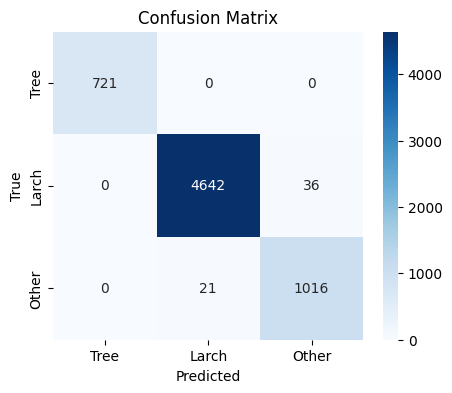

In [59]:
import os
import random
import torch

# 1) Define your partitions of prefixes
larch_other_prefixes = ("B01",  "B07", "B02", "B03")
tree_prefixes       = ("2018", "2019")
all_prefixes        = larch_other_prefixes + tree_prefixes

# 2) List and filter your full‐image files
base_dir = "/kaggle/input/tree-crown-dataset/neon-dataset/training/RGB"
all_files = [f for f in os.listdir(base_dir) if f.endswith(".tif")]
# keep only those whose filename (without extension) starts with one of our prefixes
filtered = [
    os.path.join(base_dir, f)
    for f in all_files
    if any(f.startswith(pref) for pref in all_prefixes)
]

# 3) Sample 100 at random (or fewer if not enough)
random.seed(42)
full_image_paths = random.sample(filtered, k=min(150, len(filtered)))

# 4) Run evaluation
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
evaluate_full_images(
    full_image_paths,
    annotation_dir="/kaggle/input/tree-crown-dataset/neon-dataset/annotations",
    model=model,
    device=device
)
